In [1]:
import re
import os
import sys
import glob
import time
import numpy  as np
import pandas as pd

import matplotlib.pyplot as plt

from datetime import datetime

from matplotlib.colors import LogNorm

import peakutils

In [2]:
### Import functions from peak_functions

repository_path = os.path.abspath('/Users/romoluque_c/Repositories/BACON_romo/')
sys.path.append(repository_path)

import fit_functions  as fitf

In [3]:
evts_path = '/Users/romoluque_c/LEGEND/BACON/new_setup/data_npz_run3/'

thr_ADC        = 80
sg_filt_window = 30
min_dist       = 50

def extract_date_obj_and_number(filename):
    match       = re.search(r"(\d{2}_\d{2}_\d{4})-file_(\d+)", filename)
    date_str    = match.group(1)
    file_number = int(match.group(2))
    date_obj    = datetime.strptime(date_str, "%m_%d_%Y")
    return date_obj, file_number

def extract_date_and_number(filename):
    match = re.search(r"(\d{2}_\d{2}_\d{4})-file_(\d+)", filename)
    return match.group(1), int(match.group(2))

def adapt_evt_id(evt_id, fnum):
    return 1000000*fnum + np.array(evt_id)

filt_files   = glob.glob(evts_path + f'/BACoN_run3_hits_and_times_thr{thr_ADC}_mean_w{sg_filt_window}_dist{min_dist}_abs_vals_run-*')
sorted_files = sorted(filt_files, key=extract_date_obj_and_number)

In [4]:
start_time = time.time()

filt_evts_dict = {}
idx_max        = {}
height_sg      = {}

trigg_evts_dict = {}
idx_max_trigg   = {}
height_sg_trigg = {}

normal_chs  = range(9)
trigger_chs = [9, 10, 11]

print(len(sorted_files))
for ifile,filename in enumerate(sorted_files):
    if ifile%20==0:
        print(ifile)
    d          = np.load(filename, allow_pickle=True)
    date, fnum = extract_date_and_number(filename)

    if date not in filt_evts_dict:
        print(date)
        filt_evts_dict[date] = {ch: d['filt_evts_dict'] .item()[ch] for ch in normal_chs}
        idx_max       [date] = {ch: d['idx_peaks_max']  .item()[ch] for ch in normal_chs}
        height_sg     [date] = {ch: d['height_peaks_sg'].item()[ch] for ch in normal_chs}
    else:
        for ch in normal_chs:
            try:
                filt_evts_dict[date][ch] = np.concatenate((filt_evts_dict[date][ch], adapt_evt_id(d['filt_evts_dict'].item()[ch], fnum)))
                idx_max       [date][ch] = np.concatenate((idx_max       [date][ch], d['idx_peaks_max']  .item()[ch]))
                height_sg     [date][ch] = np.concatenate((height_sg     [date][ch], d['height_peaks_sg'].item()[ch]))
            except Exception as e:
                print(date, fnum, filename, ch, str(e))
                continue

                
    if date not in idx_max_trigg:
        print(date)
        trigg_evts_dict[date] = {ch: np.arange(len(d['idx_peaks_max_trigg'].item()[9])) for ch in trigger_chs}
        idx_max_trigg  [date] = {ch: d['idx_peaks_max_trigg']  .item()[ch] for ch in trigger_chs}
        height_sg_trigg[date] = {ch: d['height_peaks_sg_trigg'].item()[ch] for ch in trigger_chs}
    else:
        for ch in trigger_chs:
            try:
                trigg_evts_dict[date][ch] = np.concatenate((trigg_evts_dict[date][ch], adapt_evt_id(np.arange(len(d['idx_peaks_max_trigg'].item()[9])), fnum)))
                idx_max_trigg  [date][ch] = np.concatenate((idx_max_trigg  [date][ch], d['idx_peaks_max_trigg']  .item()[ch]))
                height_sg_trigg[date][ch] = np.concatenate((height_sg_trigg[date][ch], d['height_peaks_sg_trigg'].item()[ch]))
            except Exception as e:
                print(date, fnum, filename, ch, str(e))
                continue
                
end_time     = time.time()                
elapsed_time = end_time - start_time
print(f"Elapsed time: {elapsed_time} s, {elapsed_time/60} min")

1379
0
09_10_2024
09_10_2024
09_11_2024
09_11_2024
20
40
09_12_2024
09_12_2024
60
09_20_2024
09_20_2024
80
100
120
140
160
09_25_2024
09_25_2024
180
200
220
09_28_2024
09_28_2024
240
260
280
10_04_2024
10_04_2024
300
320
340
360
10_04_2024 79 /Users/romoluque_c/LEGEND/BACON/new_setup/data_npz_run3/BACoN_run3_hits_and_times_thr80_mean_w30_dist50_test_run-10_04_2024-file_79.npz 1 all the input arrays must have same number of dimensions, but the array at index 0 has 1 dimension(s) and the array at index 1 has 2 dimension(s)
10_04_2024 79 /Users/romoluque_c/LEGEND/BACON/new_setup/data_npz_run3/BACoN_run3_hits_and_times_thr80_mean_w30_dist50_test_run-10_04_2024-file_79.npz 3 all the input arrays must have same number of dimensions, but the array at index 0 has 1 dimension(s) and the array at index 1 has 2 dimension(s)
10_11_2024
10_11_2024
380
400
420
440
460
10_17_2024
10_17_2024
480
500
520
540
560
10_25_2024
10_25_2024
580
600
620
640
11_01_2024
11_01_2024
660
680
700
720
11_11_2024
11_1

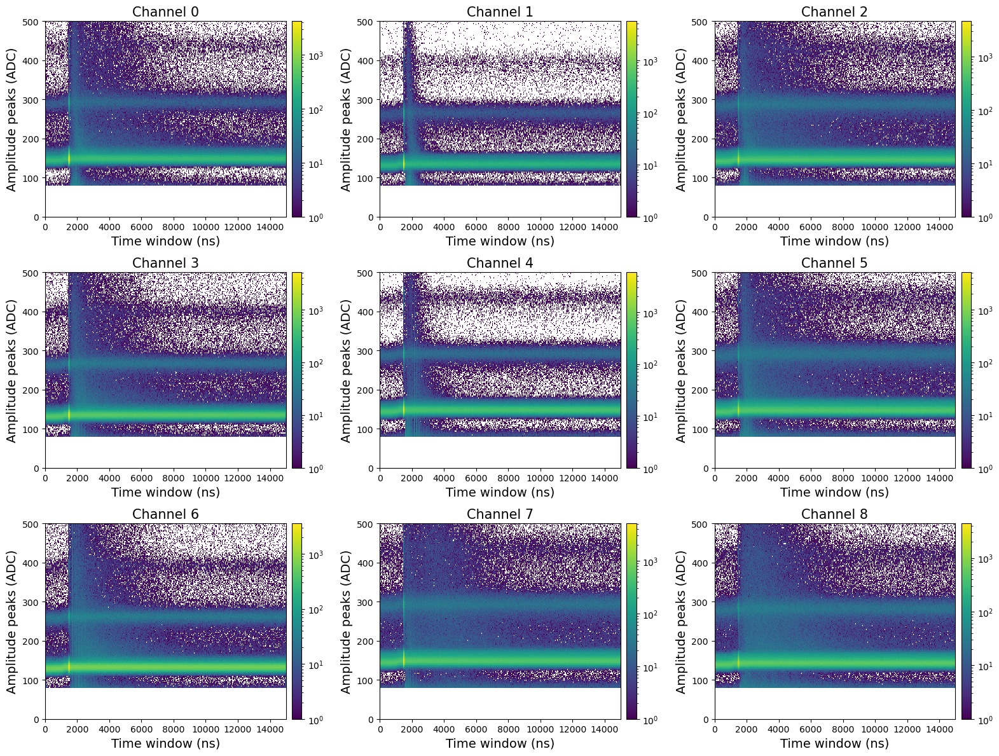

In [66]:
sel_dates = idx_max.keys()
fig, axs  = plt.subplots(3, 3, figsize=(16, 12))
for ch in normal_chs:
    i = int(ch/3)
    j = ch%3
    try:
        ch_idxs = np.concatenate([np.concatenate(idx_max  [date][ch]) for date in sel_dates])
        ch_vals = np.concatenate([np.concatenate(height_sg[date][ch]) for date in sel_dates])
    
        fig0 = axs[i][j].hist2d(ch_idxs*2, ch_vals, bins=(500, 200), range=((0, 15000), (0, 500)), cmin=1, norm=LogNorm())
        axs[i][j].set_xlabel('Time window (ns)',      fontsize=14)
        axs[i][j].set_ylabel('Amplitude peaks (ADC)', fontsize=14)
        axs[i][j].set_title(f"Channel {ch}",          fontsize=15)
        fig.colorbar(fig0[3], ax=axs[i][j], pad=0.02)
    except Exception as e:
        print(e)
        continue
plt.tight_layout()
plt.show()

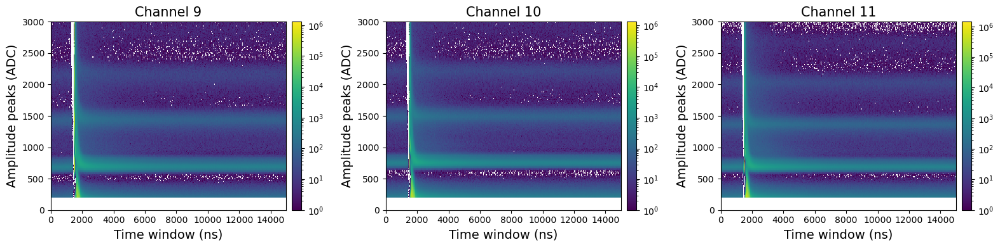

In [67]:
sel_dates = idx_max_trigg.keys()
fig, axs  = plt.subplots(1, 3, figsize=(16, 4))
for i,ch in enumerate(trigger_chs):
    try:
        ch_idxs = np.concatenate([np.concatenate(idx_max_trigg  [date][ch]) for date in sel_dates])
        ch_vals = np.concatenate([np.concatenate(height_sg_trigg[date][ch]) for date in sel_dates])
    
        fig0 = axs[i].hist2d(ch_idxs*2, ch_vals, bins=(500, 200), range=((0, 15000), (0, 3000)), cmin=1, norm=LogNorm())
        axs[i].set_xlabel('Time window (ns)',      fontsize=14)
        axs[i].set_ylabel('Amplitude peaks (ADC)', fontsize=14)
        axs[i].set_title(f"Channel {ch}",          fontsize=15)
        fig.colorbar(fig0[3], ax=axs[i], pad=0.02)
    except Exception as e:
        print(e)
        continue
plt.tight_layout()
plt.show()

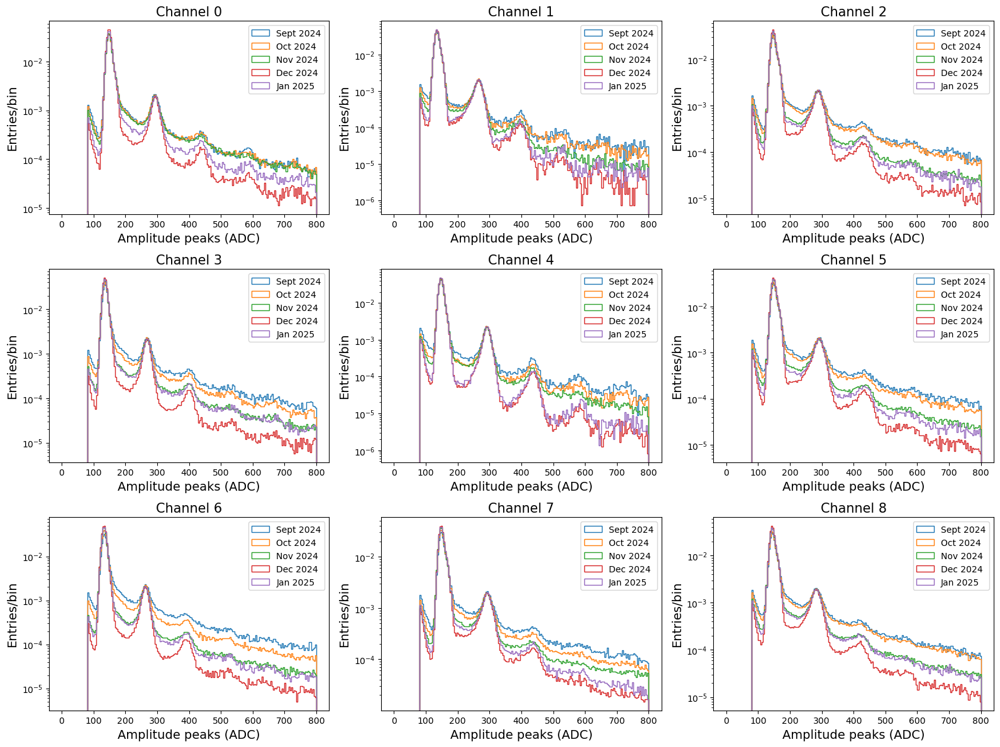

In [6]:
fig, axs = plt.subplots(3, 3, figsize=(16, 12))
for date_str, month_lab in zip(['09', '10', '11', '12', '01'], ['Sept 2024', 'Oct 2024', 'Nov 2024', 'Dec 2024', 'Jan 2025']):

    sel_dates = [date for date in idx_max.keys() if date.startswith(date_str)]
    for ch in normal_chs:
        i = int(ch/3)
        j = ch%3
        
        try:
            ch_idxs = np.concatenate([np.concatenate(idx_max  [date][ch]) for date in sel_dates])
            ch_vals = np.concatenate([np.concatenate(height_sg[date][ch]) for date in sel_dates])
        
            fig0 = axs[i][j].hist(ch_vals, bins=200, range=(0, 800), log=True, histtype='step', label=month_lab, density=True)
            axs[i][j].set_xlabel('Amplitude peaks (ADC)', fontsize=14)
            axs[i][j].set_ylabel('Entries/bin',           fontsize=14)
            axs[i][j].set_title(f"Channel {ch}",           fontsize=15)
            axs[i][j].legend()
        except Exception as e:
            print(e)
            continue
plt.tight_layout()
plt.show()

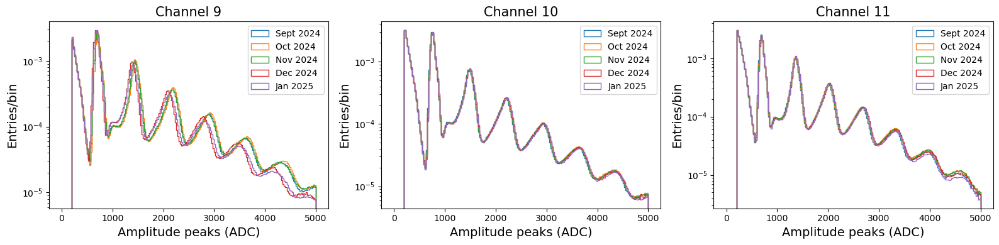

In [5]:
fig, axs = plt.subplots(1, 3, figsize=(16, 4))
for date_str, month_lab in zip(['09', '10', '11', '12', '01'], ['Sept 2024', 'Oct 2024', 'Nov 2024', 'Dec 2024', 'Jan 2025']):

    sel_dates = [date for date in idx_max.keys() if date.startswith(date_str)]
    for i,k in enumerate(trigger_chs):
        try:
            ch_idxs = np.concatenate([np.concatenate(idx_max_trigg  [date][k]) for date in sel_dates])
            ch_vals = np.concatenate([np.concatenate(height_sg_trigg[date][k]) for date in sel_dates])
        
            fig0 = axs[i].hist(ch_vals, bins=200, range=(0, 5000), log=True, histtype='step', label=month_lab, density=True)
            axs[i].set_xlabel('Amplitude peaks (ADC)', fontsize=14)
            axs[i].set_ylabel('Entries/bin',           fontsize=14)
            axs[i].set_title(f"Channel {k}",           fontsize=15)
            axs[i].legend()
        except Exception as e:
            print(e)
            continue
plt.tight_layout()
plt.show()

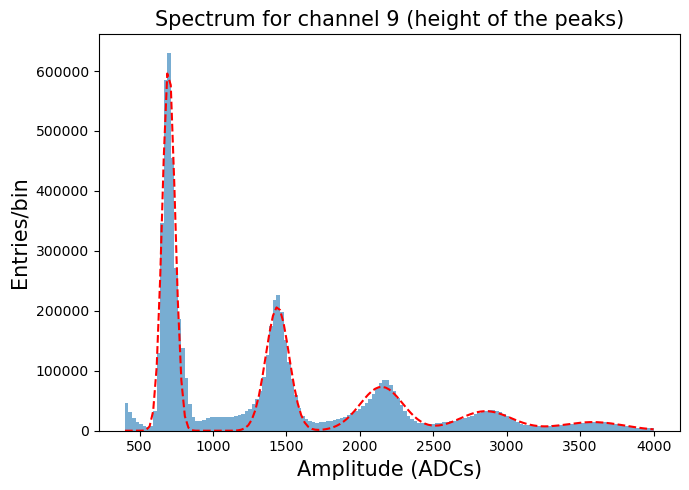

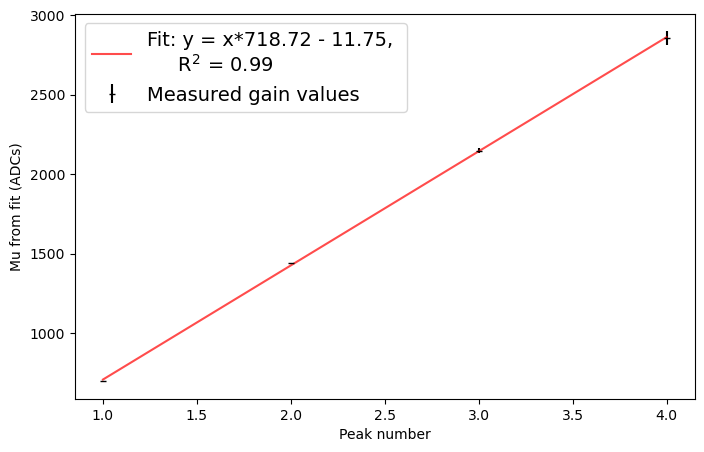

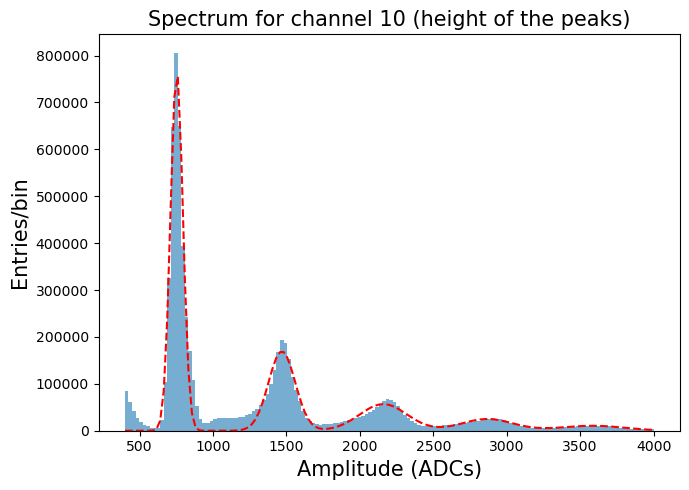

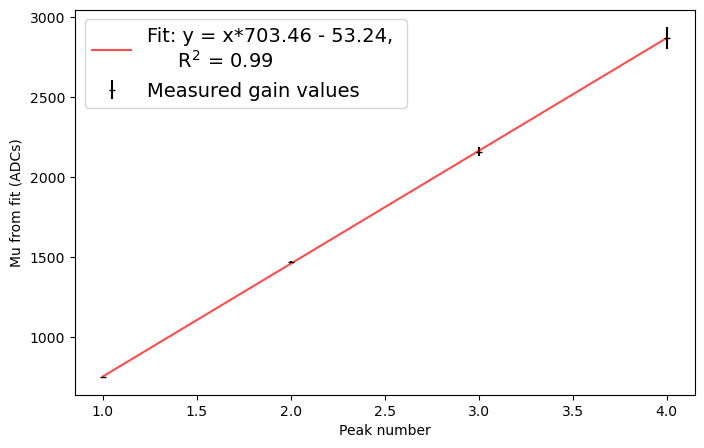

/Users/romoluque_c/anaconda3/lib/python3.10/site-packages/scipy/optimize/_minpack_py.py:906: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


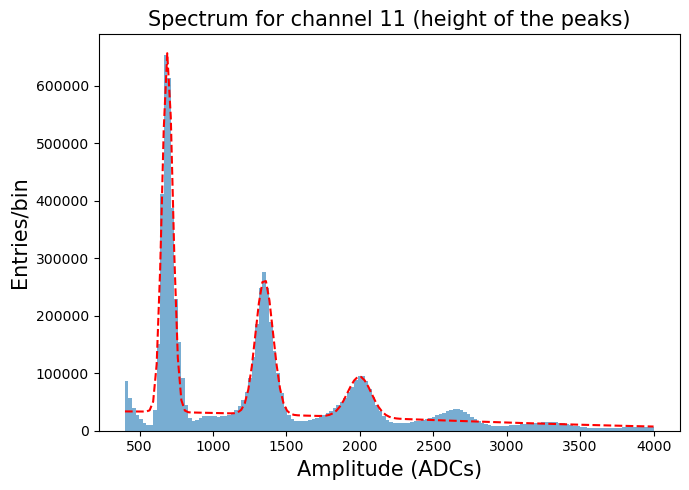

/Users/romoluque_c/anaconda3/lib/python3.10/site-packages/matplotlib/axes/_base.py:2503: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)


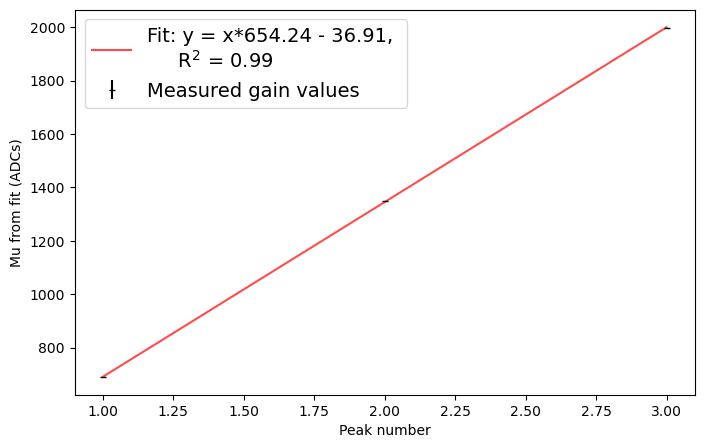

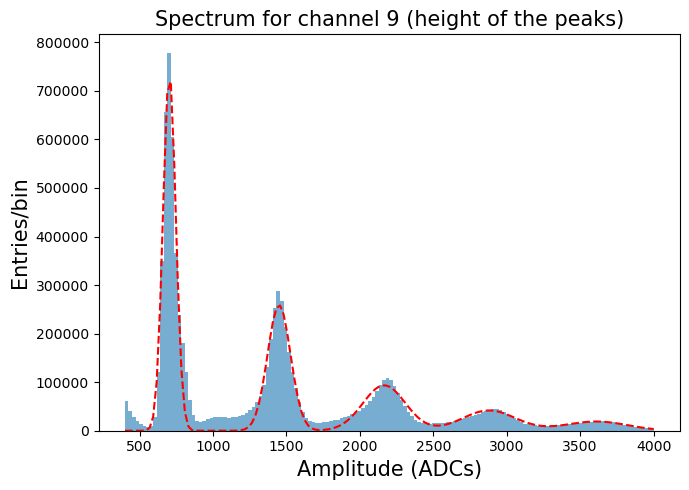

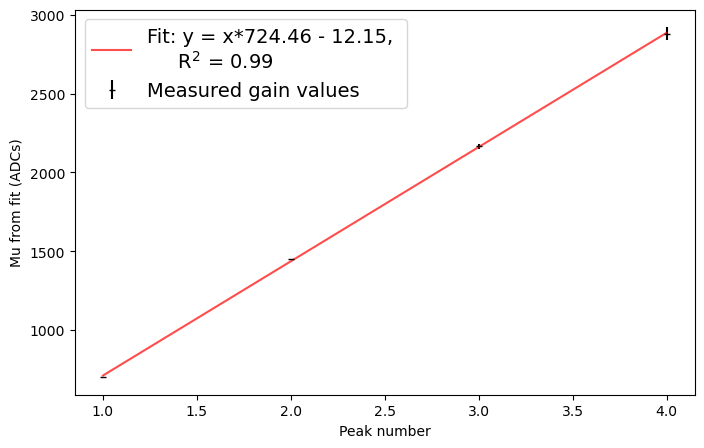

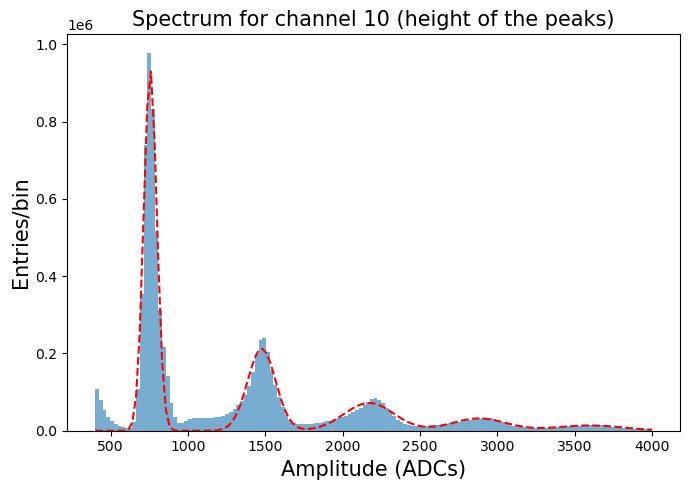

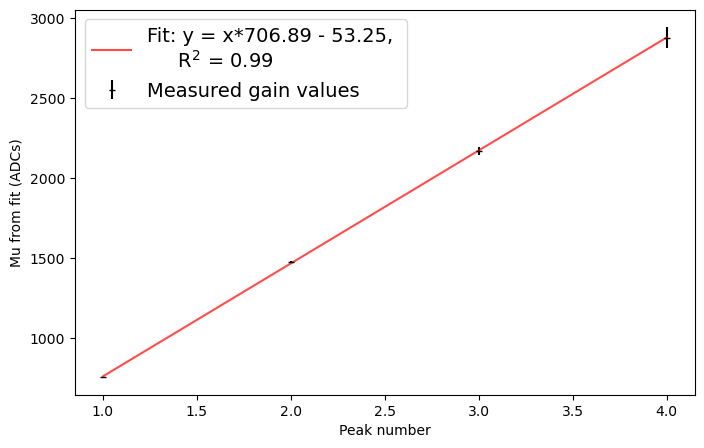

...

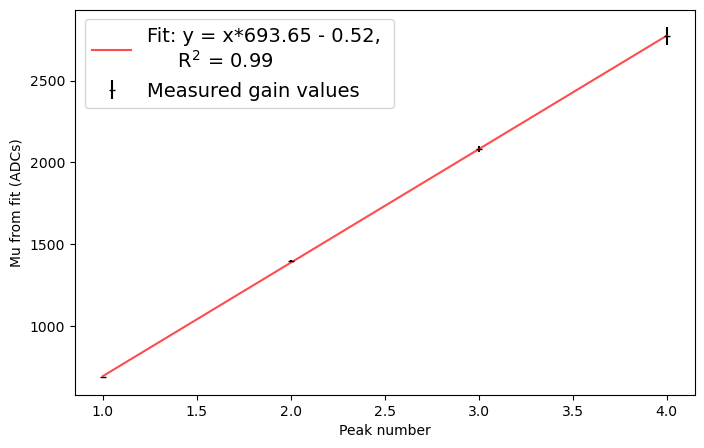

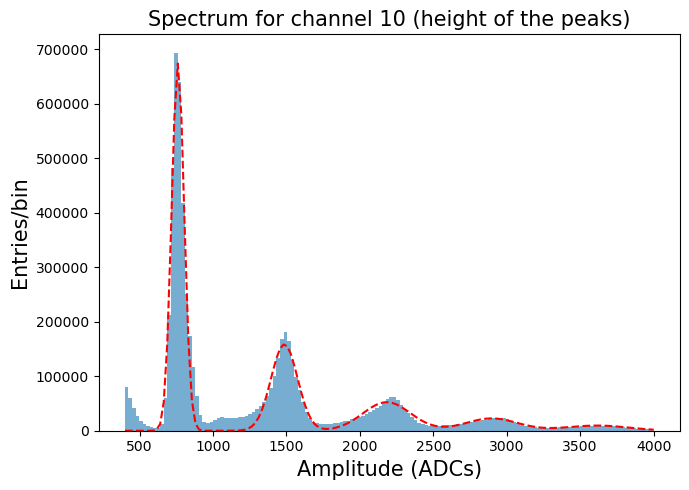

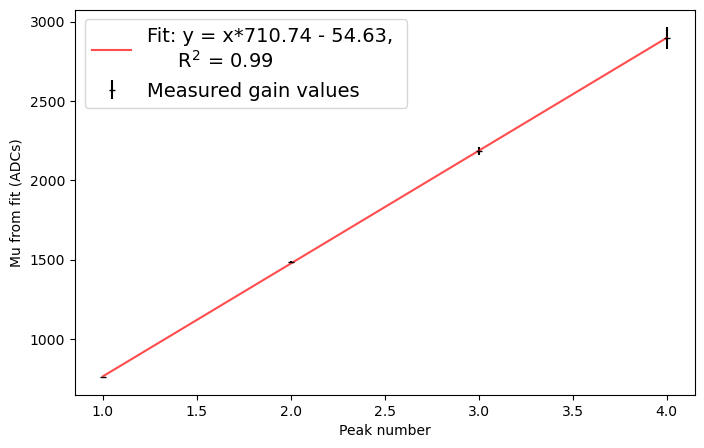

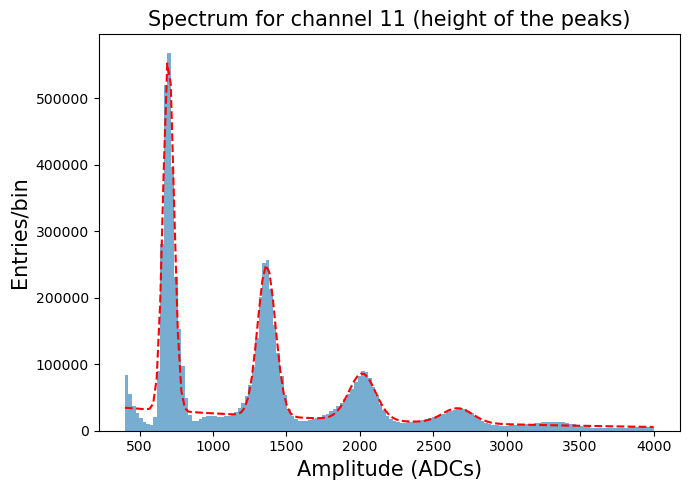

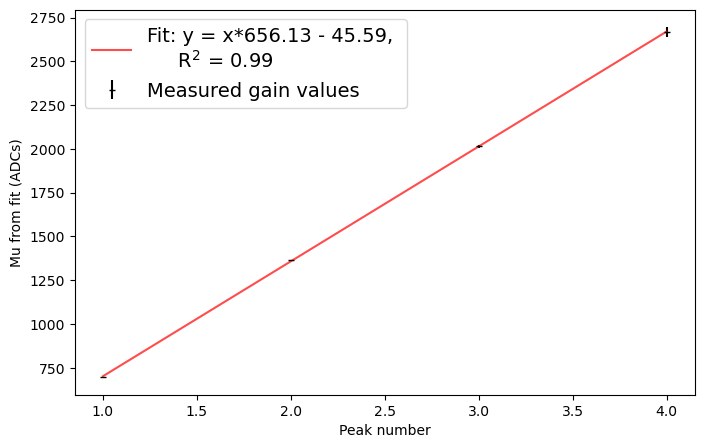

In [7]:
slopes     = {}
intersects = {}
for date_str, month_lab in zip(['09', '10', '11', '12', '01'], ['Sept 2024', 'Oct 2024', 'Nov 2024', 'Dec 2024', 'Jan 2025']):
    sel_dates = [date for date in idx_max.keys() if date.startswith(date_str)]
    slope_chs = {}
    inter_chs = {}
    for ch in [9, 10, 11]:
        ch_vals     = np.concatenate([np.concatenate(height_sg_trigg[date][ch]) for date in sel_dates])
        hist, bins  = np.histogram(ch_vals, bins=200, range=(400, 4000))
        idxs        = peakutils.indexes(hist, thres=1000, min_dist=20, thres_abs=True)
        sigma_peaks = [100, 150, 180, 220, 250]
        seeds       = np.concatenate([[a, b, c] for a,b,c in zip(hist[idxs], bins[idxs], sigma_peaks)])
        if date_str=='09' and ch==11:
            num_peaks_fit = 3
        elif date_str=='12' and ch==11:
            num_peaks_fit = 3
        else:
            num_peaks_fit = 4
        try:
            slope, inters = fitf.fit_spectrum_and_plot(ch_vals, channel=ch, initial_guess=seeds, rng=(400, 4000), num_peaks_fit=num_peaks_fit)#, title=f'{date}, ch={ch}')
            slope_chs[ch] = slope
            inter_chs[ch] = inters
        except RuntimeError:
            slope_chs[ch] = 0
            continue
    if date_str=='01':
        slopes    [date_str+'_2025'] = slope_chs
        intersects[date_str+'_2025'] = inter_chs
    else:
        slopes    [date_str+'_2024'] = slope_chs
        intersects[date_str+'_2024'] = inter_chs

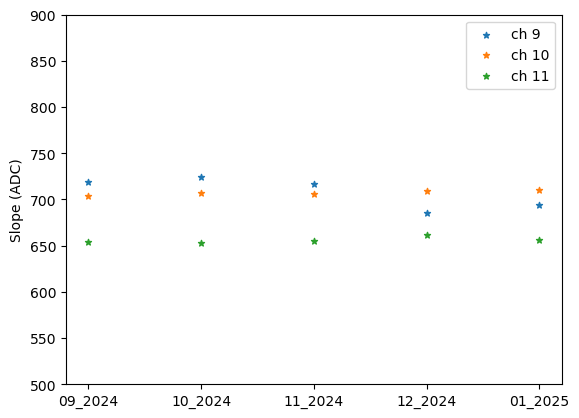

In [8]:
plt.scatter(slopes.keys(), [val[ 9] for val in slopes.values()], label='ch 9' , marker='*', s=20)
plt.scatter(slopes.keys(), [val[10] for val in slopes.values()], label='ch 10', marker='*', s=20)
plt.scatter(slopes.keys(), [val[11] for val in slopes.values()], label='ch 11', marker='*', s=20)
plt.ylim(500, 900)
plt.ylabel('Slope (ADC)')
plt.legend()
plt.show()

670.0 616.0
1408.0 652.0
2128.0 688.0
2848.0 706.0


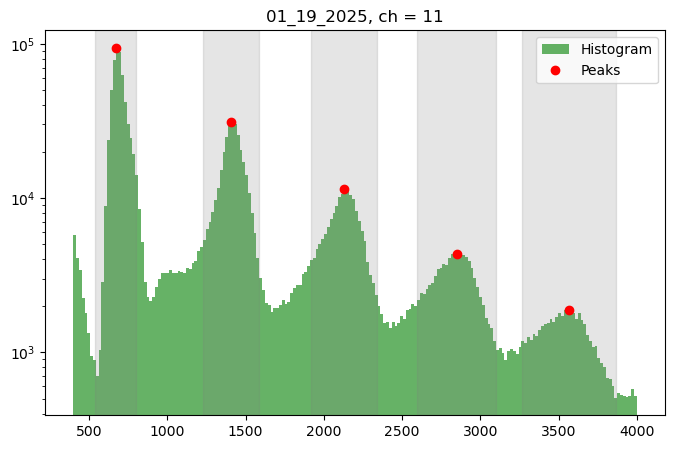

In [9]:
data = np.concatenate([np.concatenate(height_sg_trigg['09_10_2024'][9]) for date in sel_dates])
hist, bins = np.histogram(data, bins=200, range=(400, 4000))
idxs = peakutils.indexes(hist, thres=1000, min_dist=20, thres_abs=True)

plt.figure(figsize=(8, 5))
plt.hist(data, bins=200, range=(400, 4000), alpha=0.6, color='g', label="Histogram", log=True)
plt.plot(bins[idxs], hist[idxs], "ro", label="Peaks")
for i,idx in enumerate(idxs[:-1]):
    print(bins[idx], bins[np.argmin(hist[idxs[i]:idxs[i+1]])])
plt.axvspan(bins[idxs[0]]-130, bins[idxs[0]]+130, alpha=0.2, color='grey')
plt.axvspan(bins[idxs[1]]-180, bins[idxs[1]]+180, alpha=0.2, color='grey')
plt.axvspan(bins[idxs[2]]-210, bins[idxs[2]]+210, alpha=0.2, color='grey')
plt.axvspan(bins[idxs[3]]-250, bins[idxs[3]]+250, alpha=0.2, color='grey')
plt.axvspan(bins[idxs[4]]-300, bins[idxs[4]]+300, alpha=0.2, color='grey')
plt.title(f'{date}, ch = {ch}')
plt.legend()
plt.show()

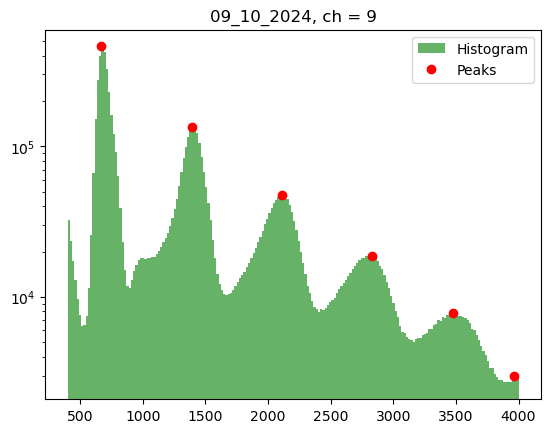

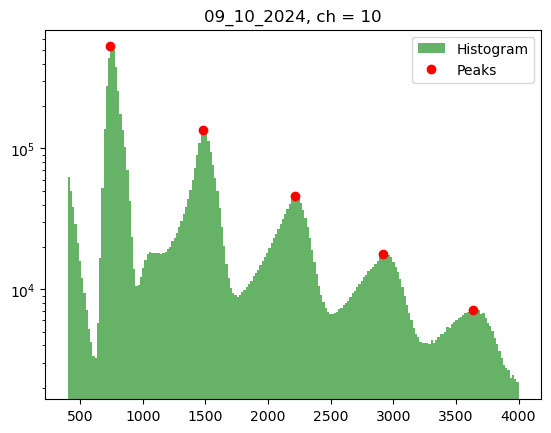

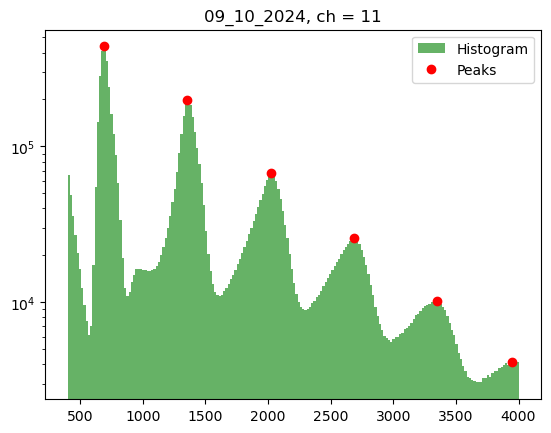

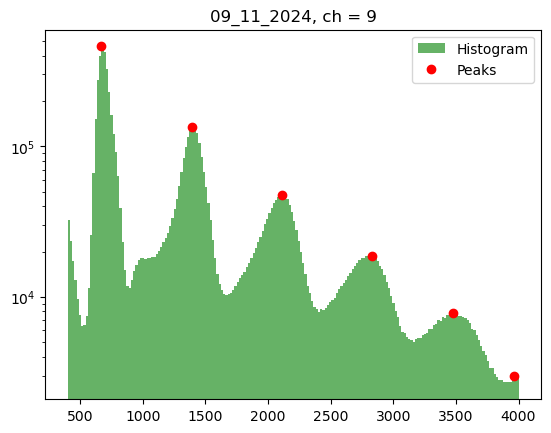

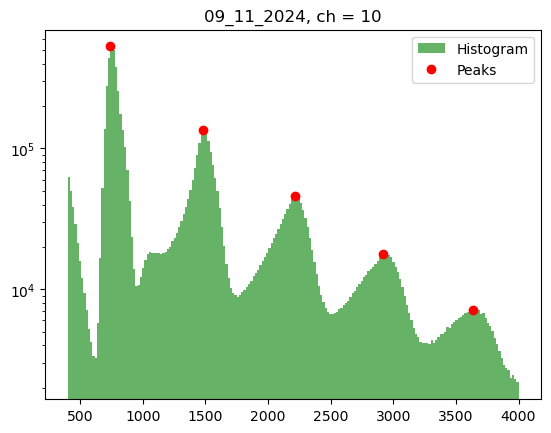

...

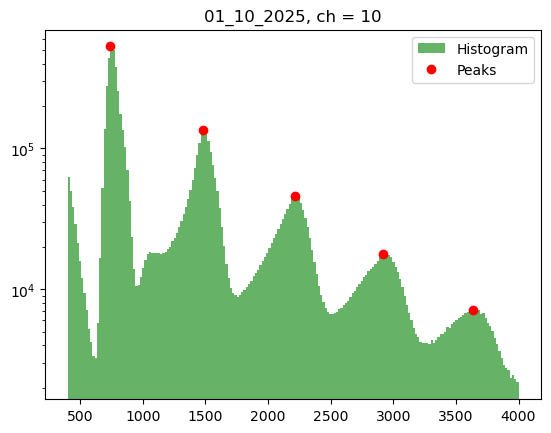

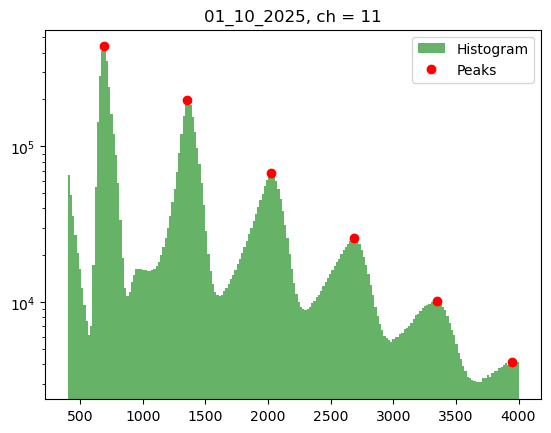

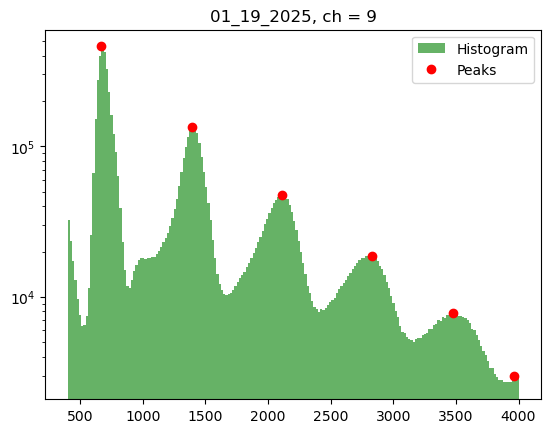

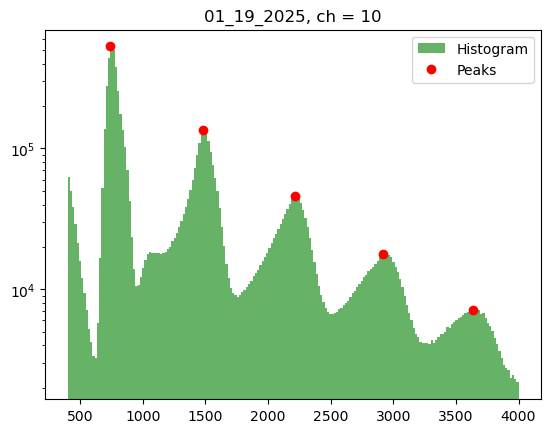

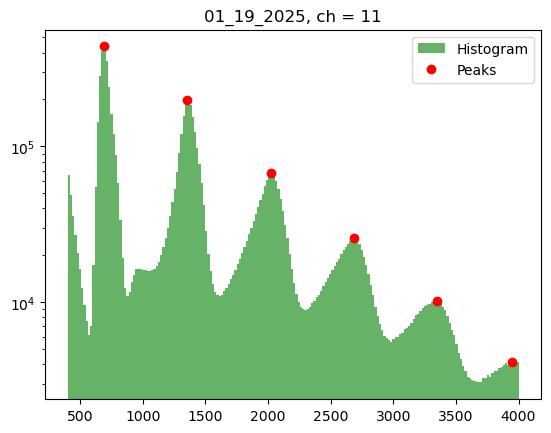

In [10]:
for date in height_sg_trigg.keys():
    for ch in trigger_chs:
        data = np.concatenate([np.concatenate(height_sg_trigg[date][ch]) for date in sel_dates])
        hist, bins = np.histogram(data, bins=200, range=(400, 4000))
        idxs = peakutils.indexes(hist, thres=1000, min_dist=20, thres_abs=True)
        plt.hist(data, bins=200, range=(400, 4000), alpha=0.6, color='g', label="Histogram", log=True)
        plt.plot(bins[idxs], hist[idxs], "ro", label="Peaks")
        plt.title(f'{date}, ch = {ch}')
        plt.legend()
        plt.show()

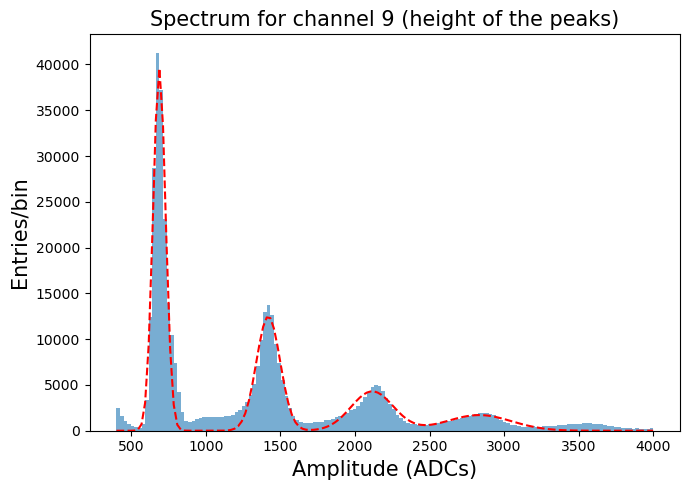

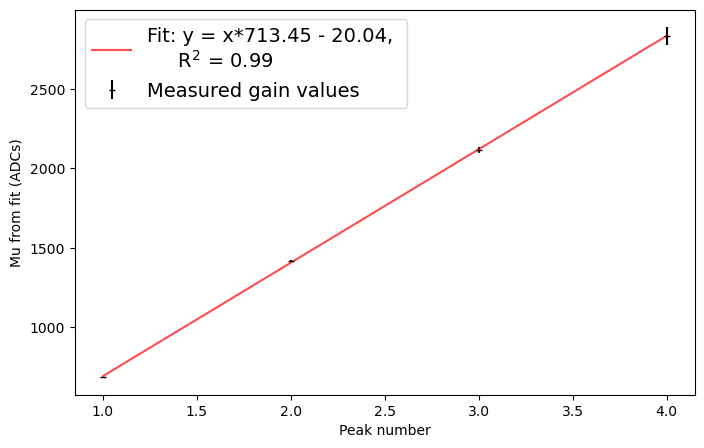

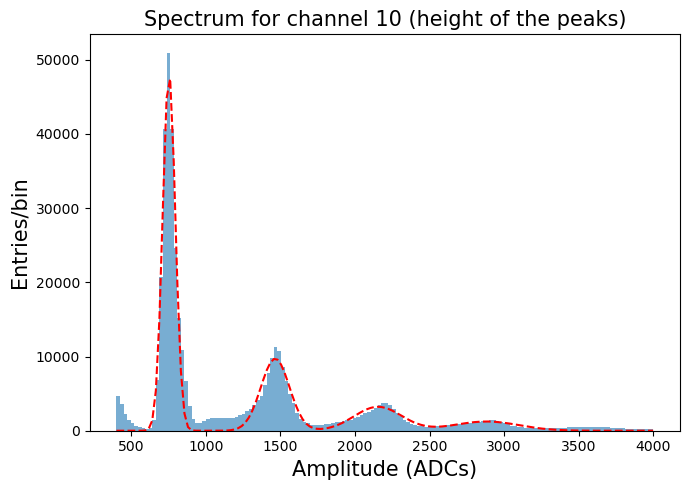

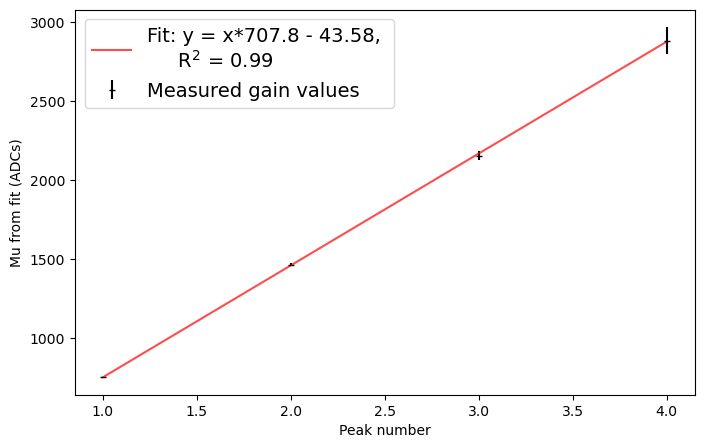

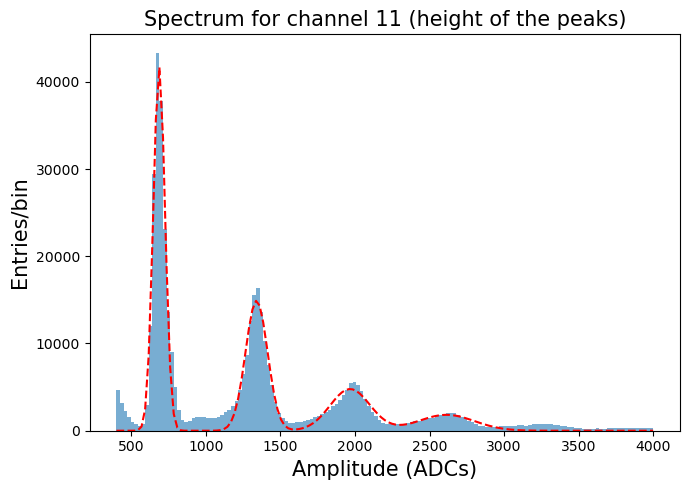

...

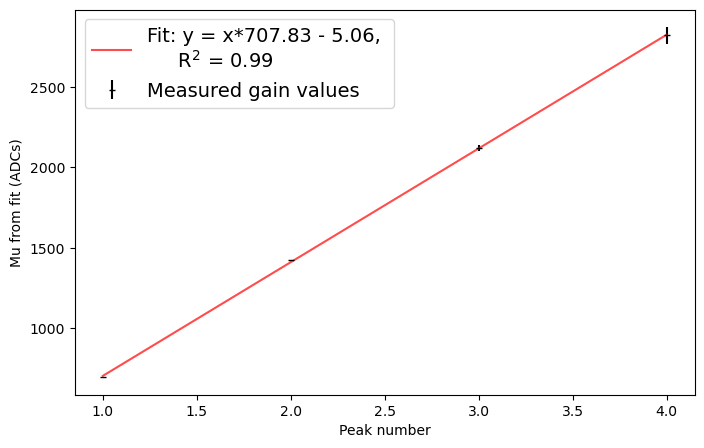

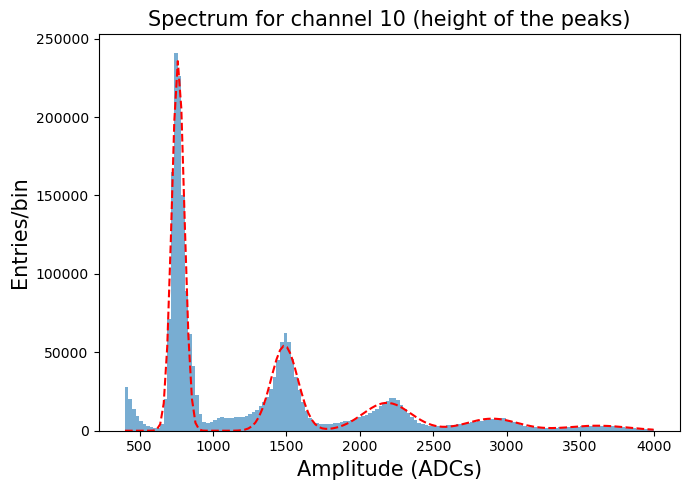

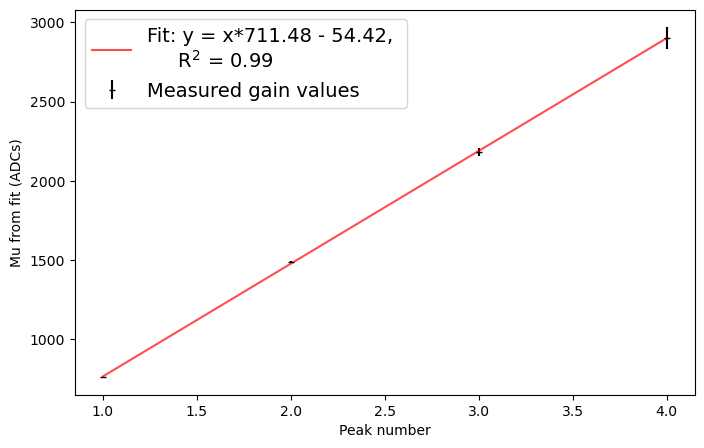

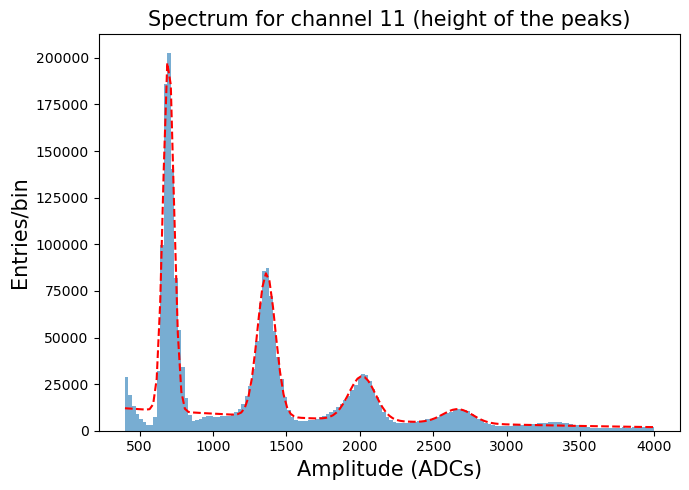

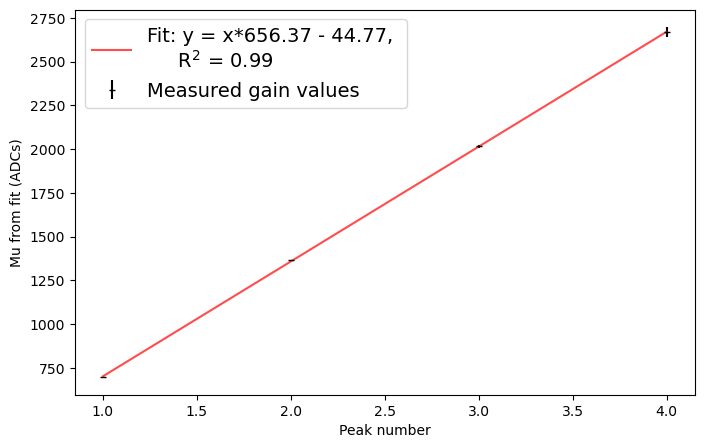

In [12]:
slopes     = {}
intersects = {}
for date in height_sg_trigg.keys():
    slope_chs = {}
    inter_chs = {}
    for ch in [9, 10, 11]:
        ch_vals     = np.concatenate(height_sg_trigg[date][ch])
        hist, bins  = np.histogram(ch_vals, bins=200, range=(400, 4000))
        idxs        = peakutils.indexes(hist, thres=1000, min_dist=20, thres_abs=True)
        sigma_peaks = [100, 150, 180, 220, 250]
        seeds       = np.concatenate([[a, b, c] for a,b,c in zip(hist[idxs], bins[idxs], sigma_peaks)])
        num_peaks_fit = 4
        try:
            slope, inters = fitf.fit_spectrum_and_plot(ch_vals, channel=ch, initial_guess=seeds, rng=(400, 4000), num_peaks_fit=num_peaks_fit)#, title=f'{date}, ch={ch}')
            slope_chs[ch] = slope
            inter_chs[ch] = inters
        except RuntimeError:
            slope_chs[ch] = 0
            inter_chs[ch] = 0
            continue
    slopes    [date] = slope_chs
    intersects[date] = inter_chs

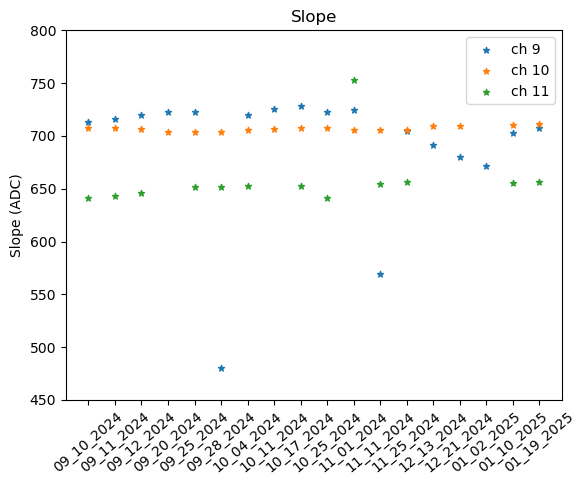

In [13]:
plt.scatter(slopes.keys(), [val[ 9] for val in slopes.values()], label='ch 9' , marker='*', s=20)
plt.scatter(slopes.keys(), [val[10] for val in slopes.values()], label='ch 10', marker='*', s=20)
plt.scatter(slopes.keys(), [val[11] for val in slopes.values()], label='ch 11', marker='*', s=20)
plt.ylabel('Slope (ADC)')
plt.title('Slope')
plt.ylim(450, 800)
plt.legend()
plt.tick_params(axis='x', rotation=40)
plt.show()

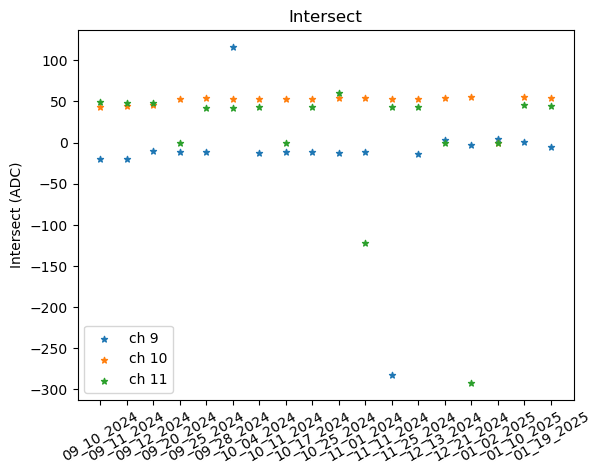

In [14]:
plt.scatter(intersects.keys(), [val[ 9] for val in intersects.values()], label='ch 9' , marker='*', s=20)
plt.scatter(intersects.keys(), [val[10] for val in intersects.values()], label='ch 10', marker='*', s=20)
plt.scatter(intersects.keys(), [val[11] for val in intersects.values()], label='ch 11', marker='*', s=20)
plt.ylabel('Intersect (ADC)')
plt.title('Intersect')
plt.legend()
plt.tick_params(axis='x', rotation=30)
plt.show()

In [15]:
gains_all_chs = {9: {'09_10_2024': (713.445, -20.038), 
                     '09_11_2024': (716.176, -19.673), 
                     '09_12_2024': (719.783, -10.151), 
                     '09_20_2024': (722.221, -11.124), 
                     '09_25_2024': (723.042, -11.830), 
                     '09_28_2024': (721.611, -12.276), 
                     '10_04_2024': (720.181, -12.722), 
                     '10_11_2024': (725.152, -12.032), 
                     '10_17_2024': (728.640, -11.851), 
                     '10_25_2024': (722.907, -12.550), 
                     '11_01_2024': (724.566, -11.215), 
                     '11_11_2024': (714.408, -12.857), 
                     '11_25_2024': (704.251, -14.499), 
                     '12_13_2024': (691.857,   2.794), 
                     '12_21_2024': (680.420,  -3.534), 
                     '01_02_2025': (671.088,   4.511), 
                     '01_10_2025': (703.052,   0.083), 
                     '01_19_2025': (707.833,  -5.059)},
                 
                 10: {'09_10_2024': (707.800, 43.580), 
                      '09_11_2024': (707.968, 44.407), 
                      '09_12_2024': (706.610, 45.092), 
                      '09_20_2024': (703.655, 53.165), 
                      '09_25_2024': (703.754, 53.722), 
                      '09_28_2024': (704.139, 52.949), 
                      '10_04_2024': (705.643, 52.823), 
                      '10_11_2024': (706.706, 53.208), 
                      '10_17_2024': (707.740, 53.039), 
                      '10_25_2024': (707.276, 53.987), 
                      '11_01_2024': (705.825, 54.078), 
                      '11_11_2024': (705.377, 53.354), 
                      '11_25_2024': (705.761, 52.763), 
                      '12_13_2024': (709.026, 53.851), 
                      '12_21_2024': (709.094, 55.053), 
                      '01_02_2025': (709.721, 55.118), 
                      '01_10_2025': (710.348, 55.183), 
                      '01_19_2025': (711.481, 54.422)},
                 
                 11: {'09_10_2024': (641.030, 48.974), 
                      '09_11_2024': (642.714, 47.617), 
                      '09_12_2024': (645.527, 48.325), 
                      '09_20_2024': (648.580, 45.411), 
                      '09_25_2024': (651.633, 42.497), 
                      '09_28_2024': (651.651, 42.437), 
                      '10_04_2024': (652.104, 42.815), 
                      '10_11_2024': (652.307, 42.757), 
                      '10_17_2024': (652.510, 42.698), 
                      '10_25_2024': (641.258, 60.174), 
                      '11_01_2024': (647.961, 51.403), 
                      '11_11_2024': (654.665, 42.632), 
                      '11_25_2024': (656.109, 43.477), 
                      '12_13_2024': (656.052, 44.115), 
                      '12_21_2024': (655.995, 44.754), 
                      '01_02_2025': (655.938, 45.393), 
                      '01_10_2025': (655.881, 46.032), 
                      '01_19_2025': (656.365, 44.774)}}

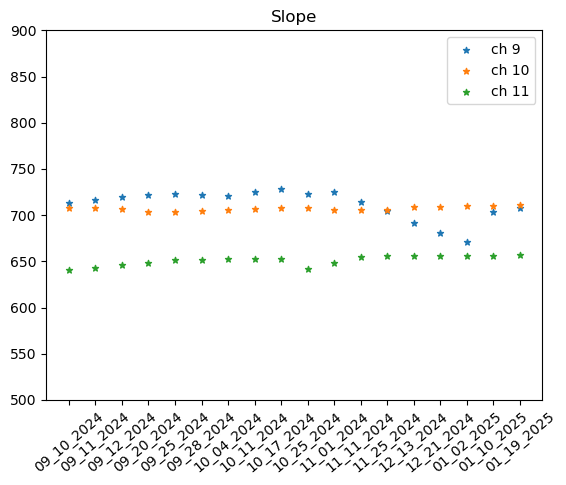

In [16]:
plt.scatter(gains_all_chs[ 9].keys(), [values[0] for values in gains_all_chs[ 9].values()], label='ch 9' , marker='*', s=20)
plt.scatter(gains_all_chs[10].keys(), [values[0] for values in gains_all_chs[10].values()], label='ch 10', marker='*', s=20)
plt.scatter(gains_all_chs[11].keys(), [values[0] for values in gains_all_chs[11].values()], label='ch 11', marker='*', s=20)
plt.ylim(500, 900)
plt.title('Slope')
plt.legend()
plt.tick_params(axis='x', rotation=40)
plt.show()

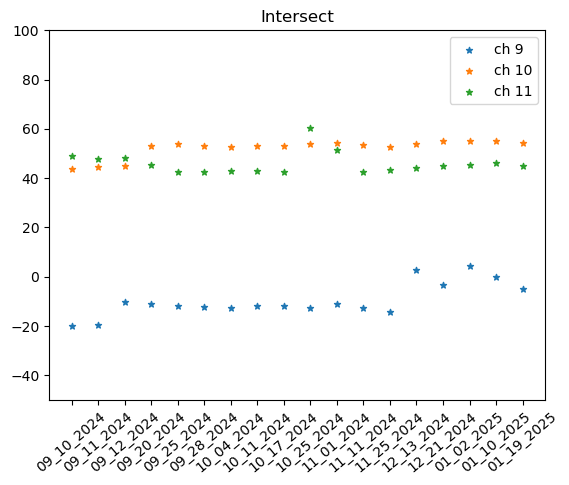

In [17]:
plt.scatter(gains_all_chs[ 9].keys(), [values[1] for values in gains_all_chs[ 9].values()], label='ch 9' , marker='*', s=20)
plt.scatter(gains_all_chs[10].keys(), [values[1] for values in gains_all_chs[10].values()], label='ch 10', marker='*', s=20)
plt.scatter(gains_all_chs[11].keys(), [values[1] for values in gains_all_chs[11].values()], label='ch 11', marker='*', s=20)
plt.ylim(-50, 100)
plt.title('Intersect')
plt.legend()
plt.tick_params(axis='x', rotation=40)
plt.show()

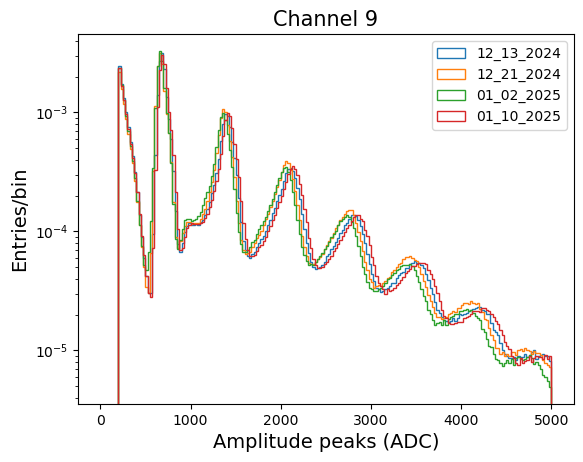

In [18]:
ch = 9
for date in ['10_25_2024', '11_01_2024', '11_11_2024', '11_25_2024', '12_13_2024', '12_21_2024', '01_02_2025', '01_10_2025'][4:]:
    
    ch_idxs = np.concatenate(idx_max_trigg  [date][ch])
    ch_vals = np.concatenate(height_sg_trigg[date][ch])
    
    plt.hist(ch_vals, bins=200, range=(0, 5000), log=True, histtype='step', label=date, density=True)
    plt.xlabel('Amplitude peaks (ADC)', fontsize=14)
    plt.ylabel('Entries/bin',           fontsize=14)
    plt.title(f"Channel {ch}",          fontsize=15)
    plt.legend()
plt.show()

## Calibrate normal channels
There's no enough statistics for some cases, so I'll join in months

140.0 180.0


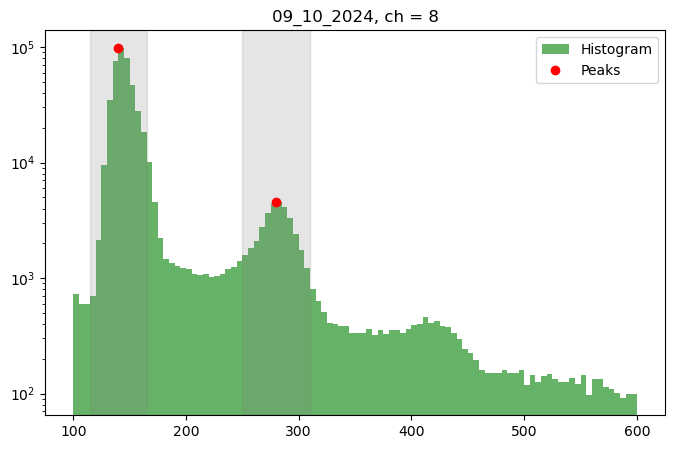

In [36]:
ch = 8

data = np.concatenate(height_sg['11_25_2024'][ch])
hist, bins = np.histogram(data, bins=100, range=(100, 600))
idxs = peakutils.indexes(hist, thres=1000, min_dist=20, thres_abs=True)

plt.figure(figsize=(8, 5))
plt.hist(data, bins=100, range=(100, 600), alpha=0.6, color='g', label="Histogram", log=True)
plt.plot(bins[idxs], hist[idxs], "ro", label="Peaks")
for i,idx in enumerate(idxs[:-1]):
    print(bins[idx], bins[np.argmin(hist[idxs[i]:idxs[i+1]])])
plt.axvspan(bins[idxs[0]]-25, bins[idxs[0]]+25, alpha=0.2, color='grey')
plt.axvspan(bins[idxs[1]]-30, bins[idxs[1]]+30, alpha=0.2, color='grey')
#plt.axvspan(bins[idxs[2]]-40, bins[idxs[2]]+40, alpha=0.2, color='grey')
plt.title(f'{date}, ch = {ch}')
plt.legend()
plt.show()

[145. 290.] [30741  1813]


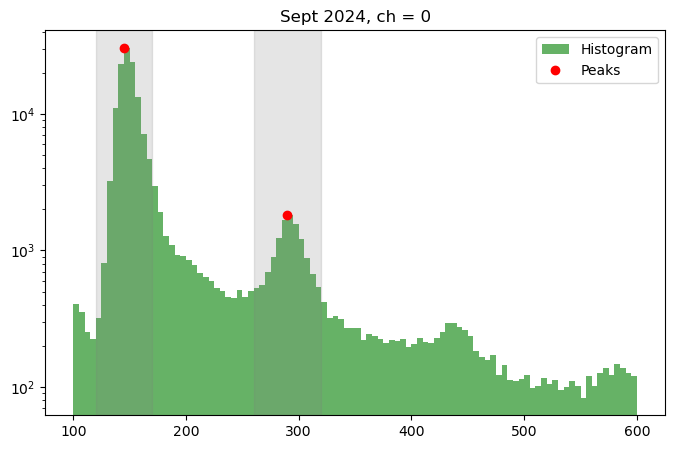

[130. 260.] [20336  1036]


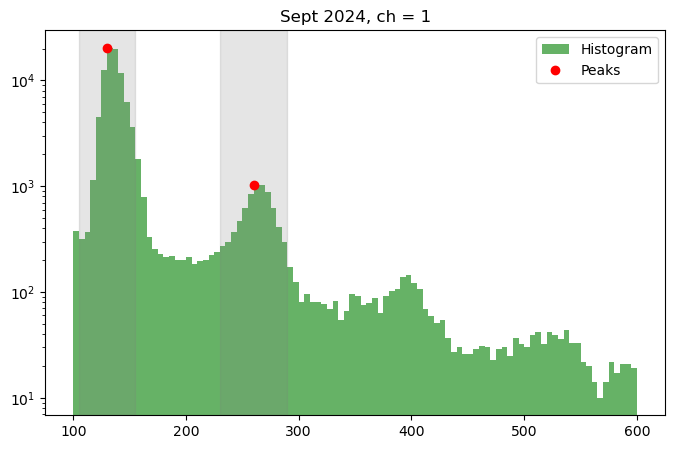

[145. 285.] [33565  2362]


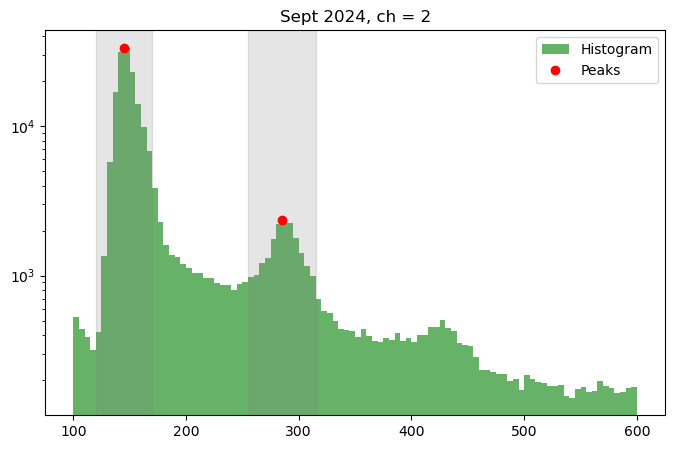

[135. 265.] [33460  2244]


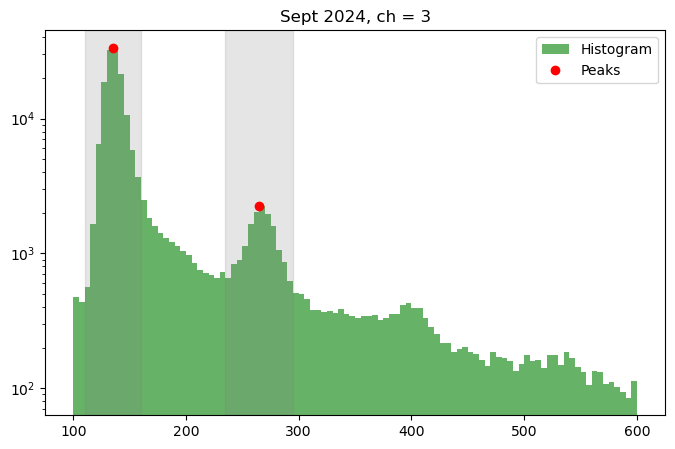

[145. 290.] [24056  1319]


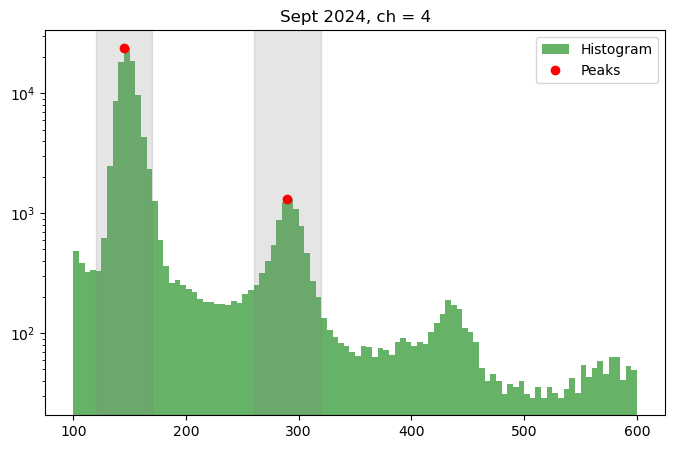

[145. 285.] [33857  2266]


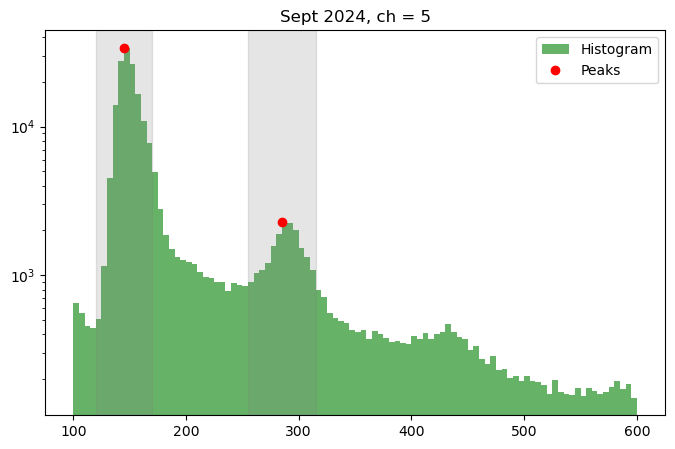

[130. 260.] [36691  2630]


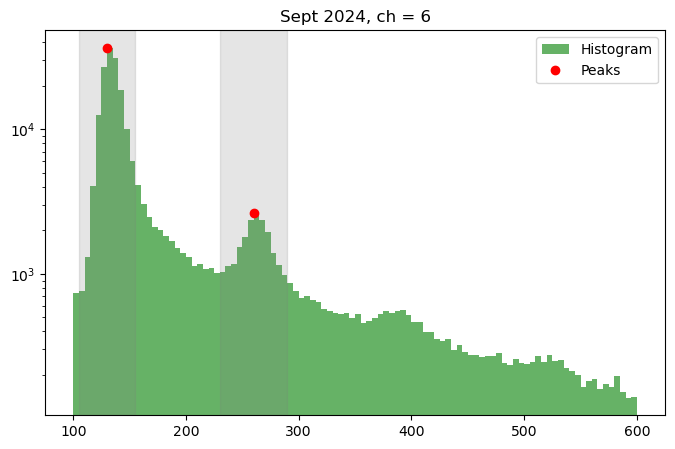

[145. 290.] [30674  2176]


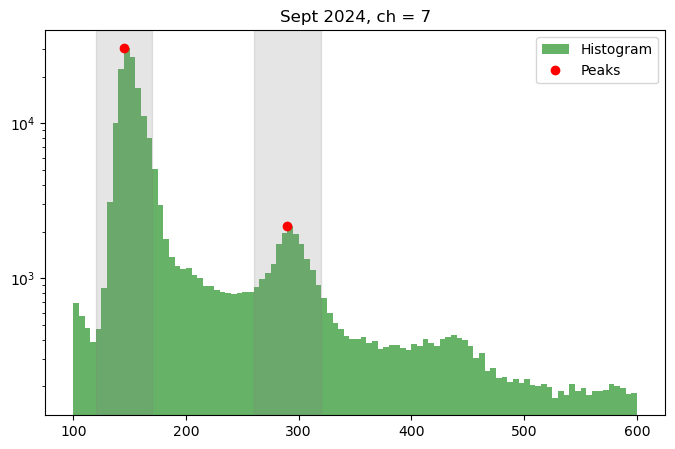

[140. 280.] [41858  2778]


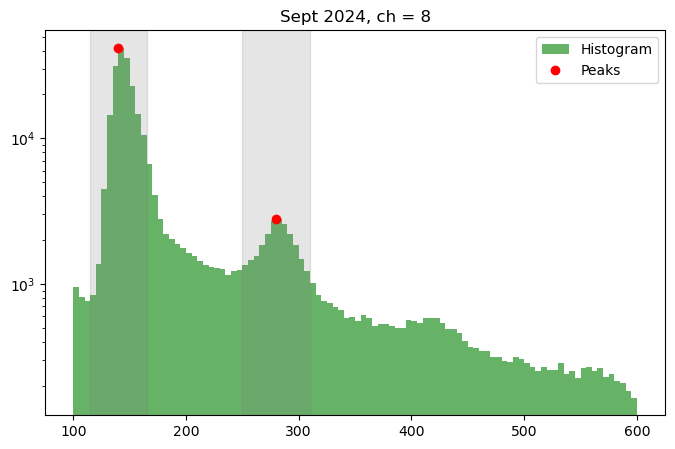

[145. 290.] [48035  2672]


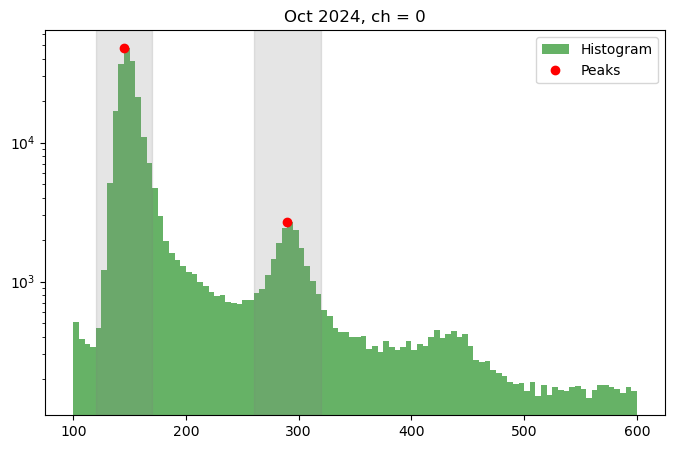

[130. 265.] [36937  1796]


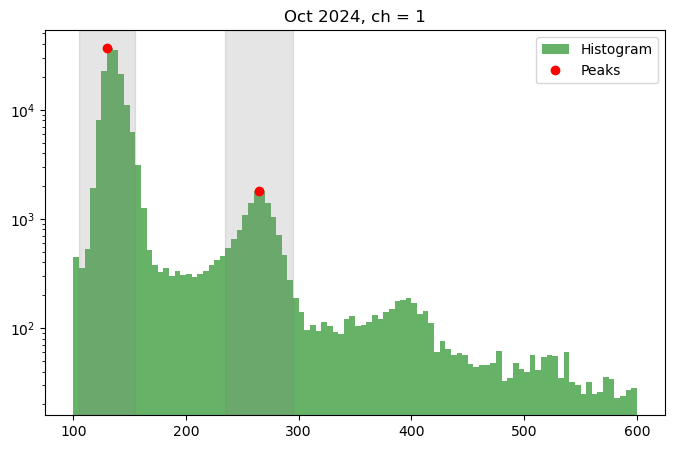

[145. 285.] [59830  4025]


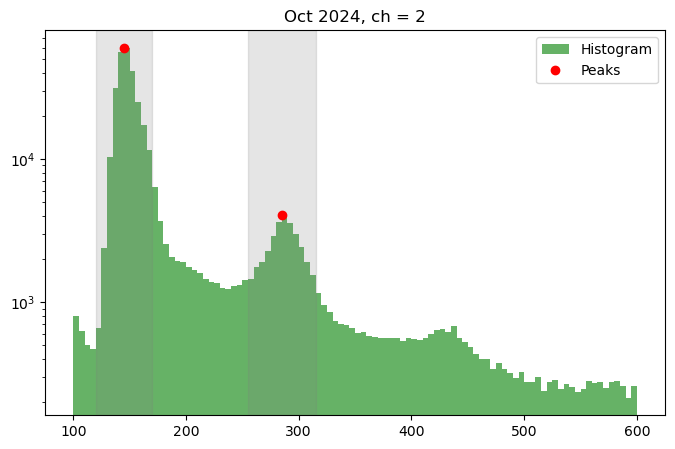

[130. 265.] [65866  3884]


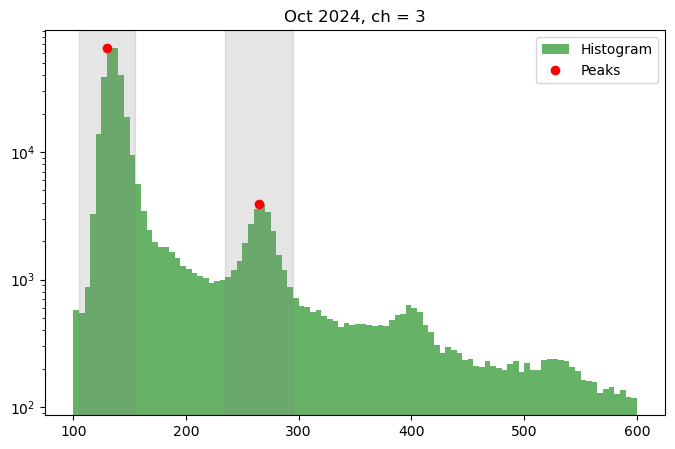

[145. 290.] [55248  2875]


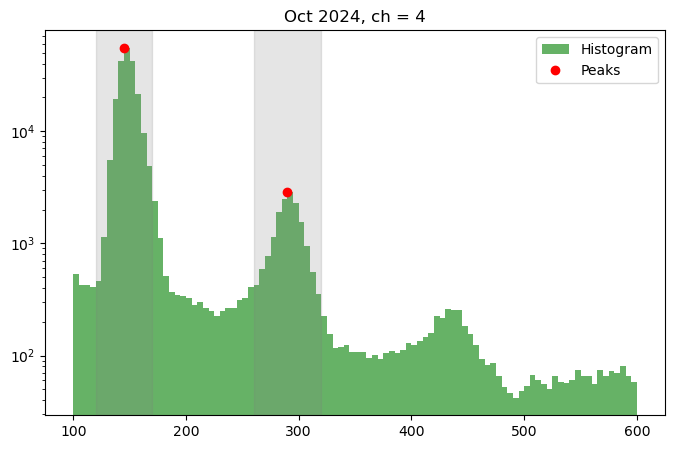

[145. 290.] [65898  4005]


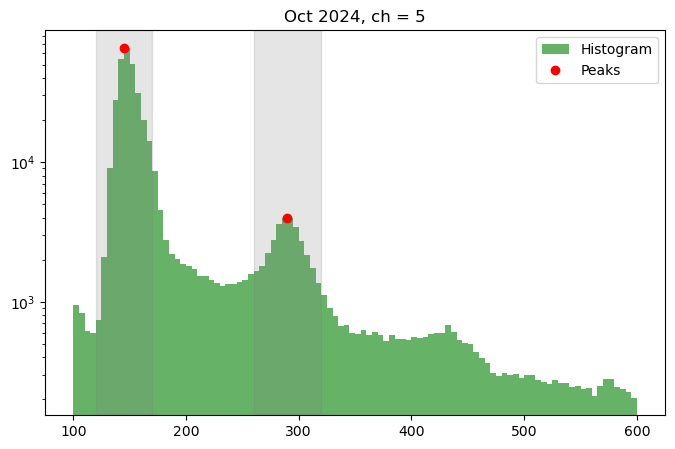

[130. 260.] [74624  4214]


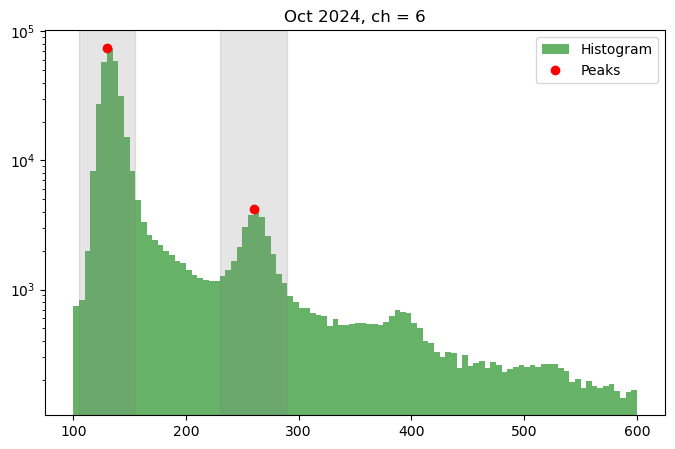

[145. 290.] [71700  4274]


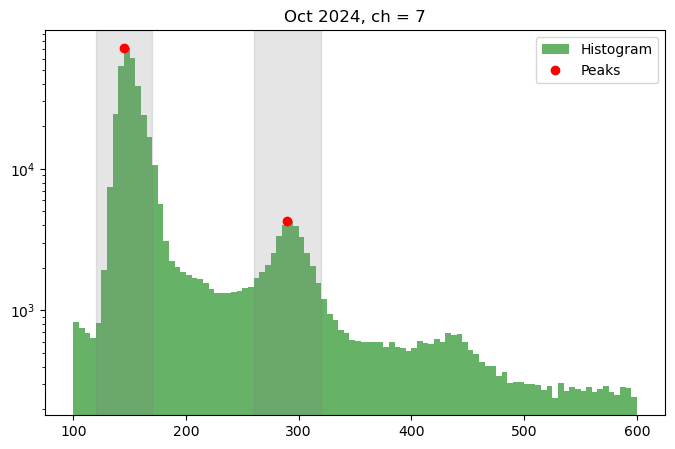

[140. 280.] [78941  4825]


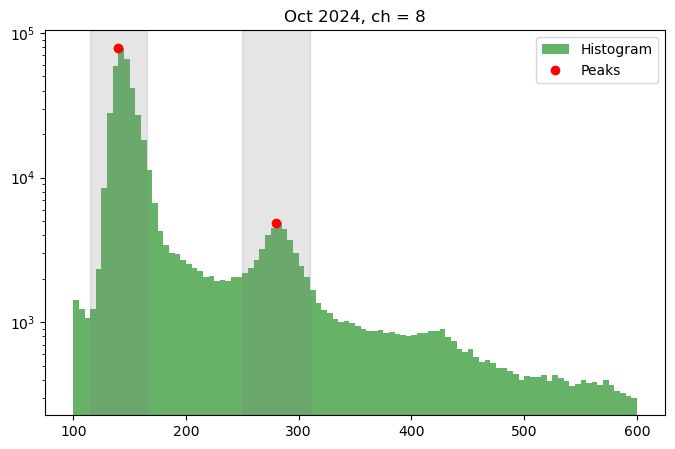

[145. 290.] [79344  4141]


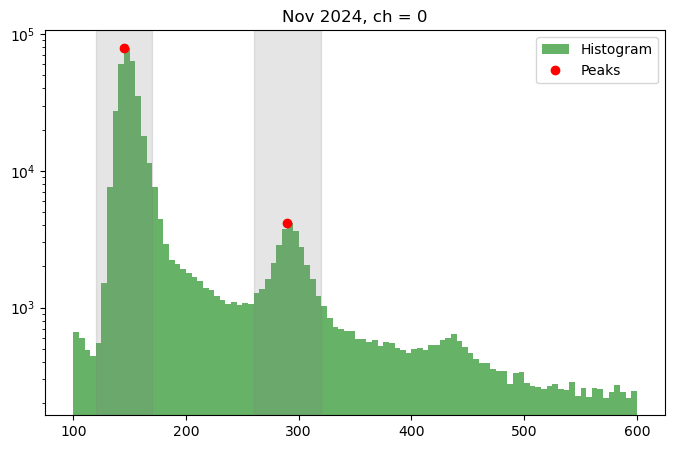

[130. 265.] [76243  3373]


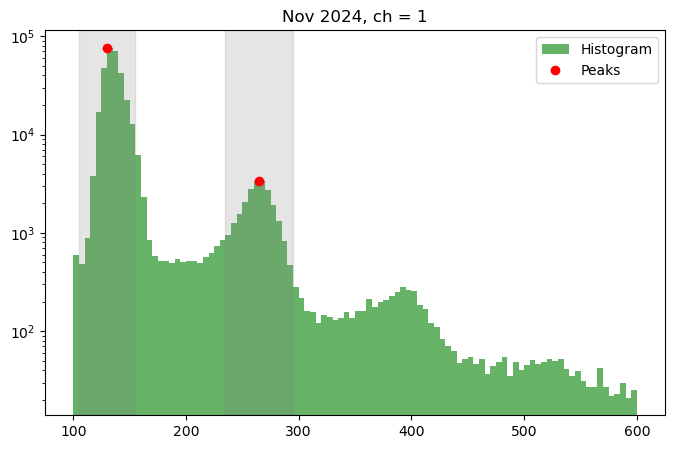

[145. 285.] [116200   6385]


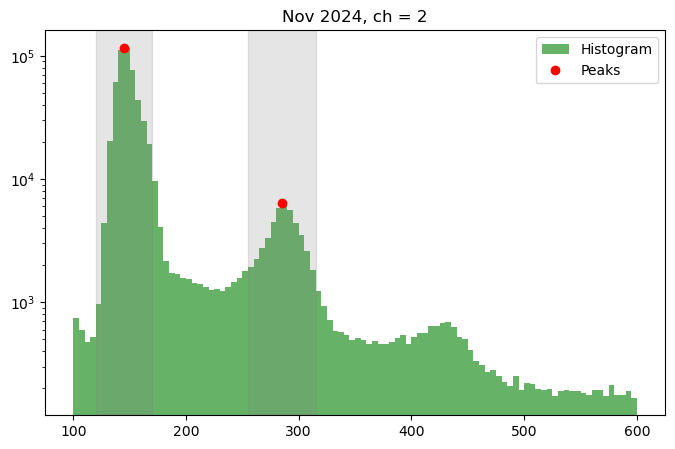

[130. 265.] [154012   7242]


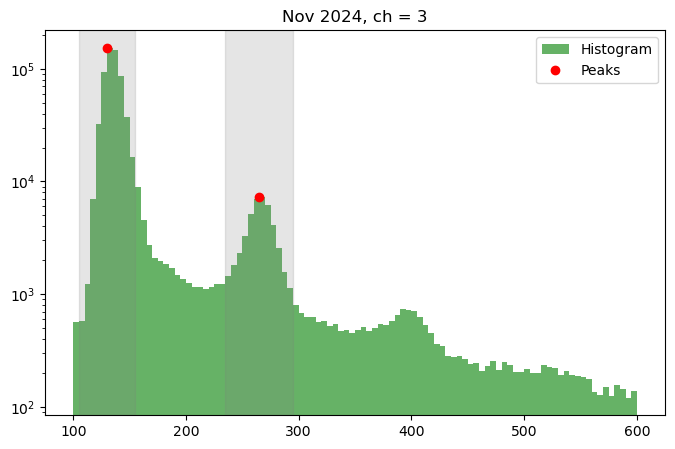

[145. 290.] [140269   6692]


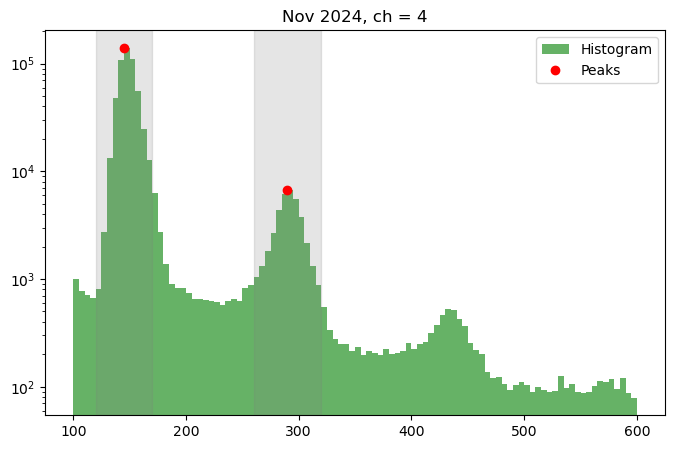

[145. 285.] [143560   7196]


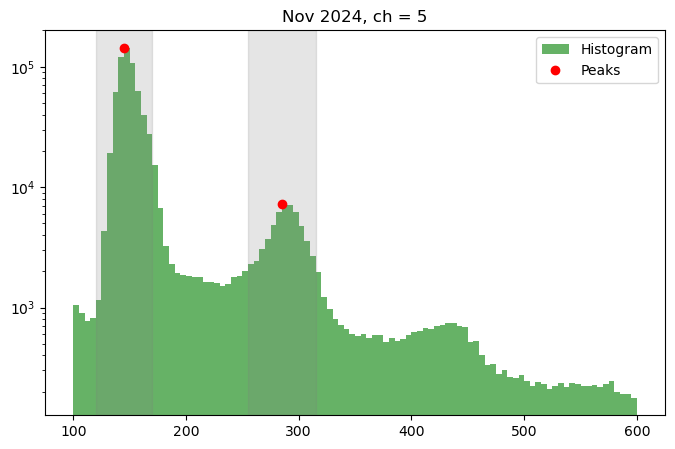

[130. 260.] [188091   8151]


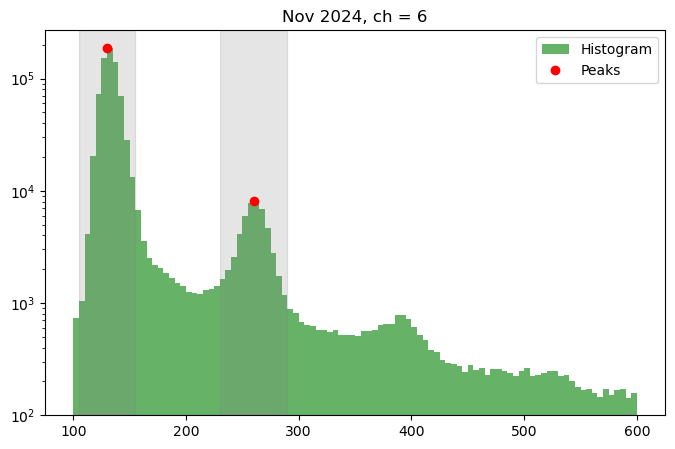

[145. 290.] [157745   8338]


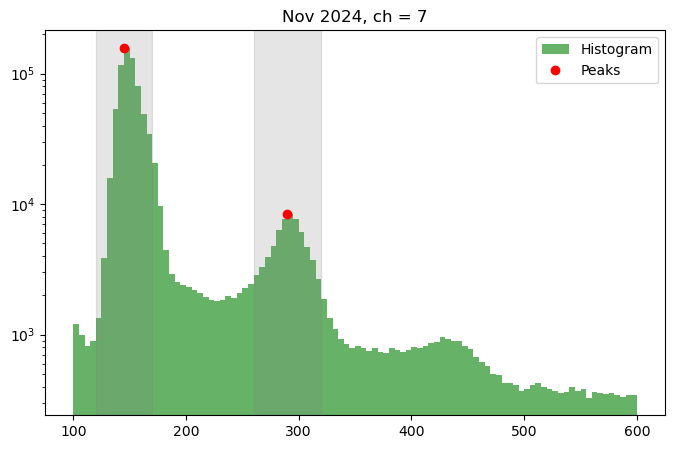

[140. 280.] [151281   7358]


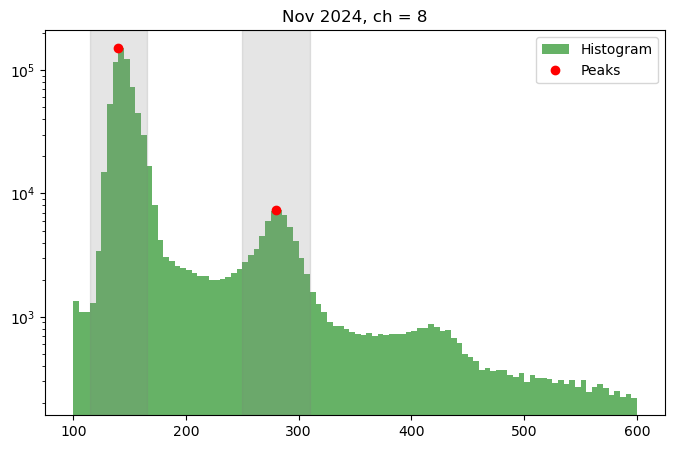

[145. 290.] [72145  3019]


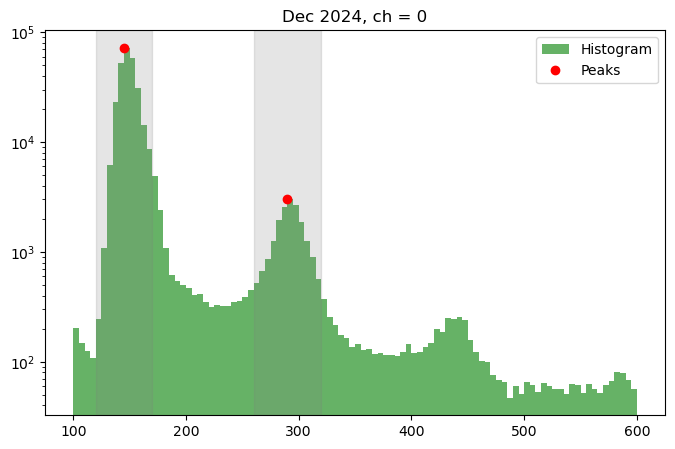

[130. 260.] [76218  3275]


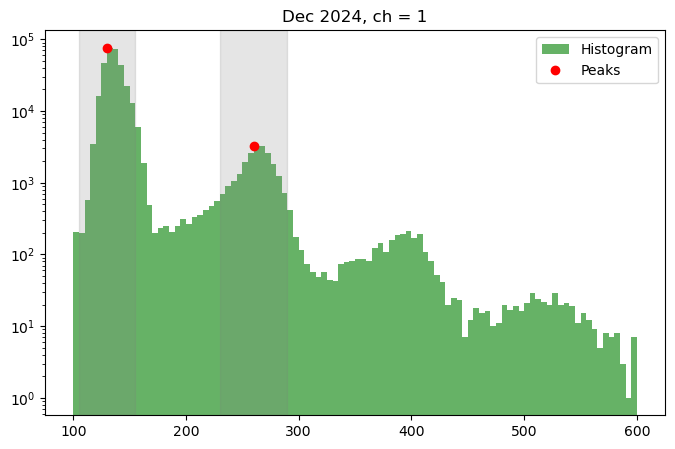

[145. 285.] [116028   5862]


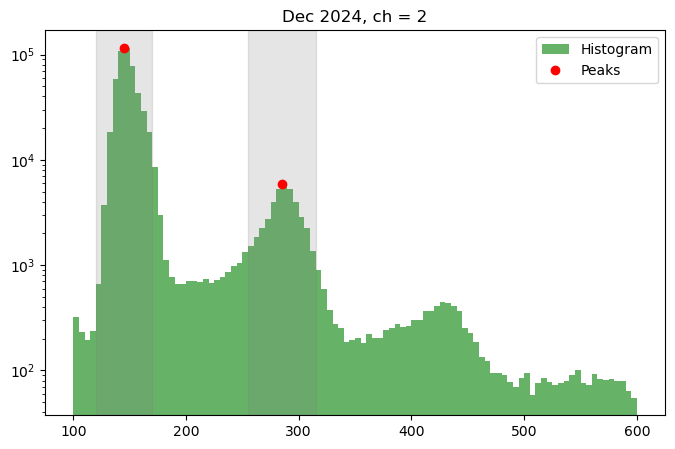

[130. 265.] [155974   6916]


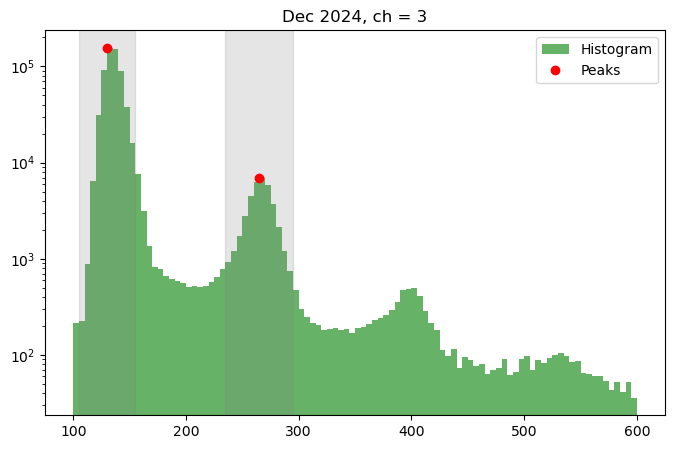

[145. 290.] [149392   7038]


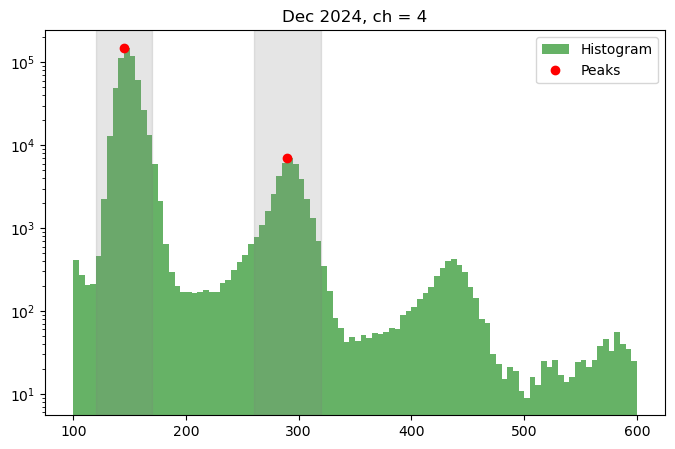

[145. 290.] [144359   6803]


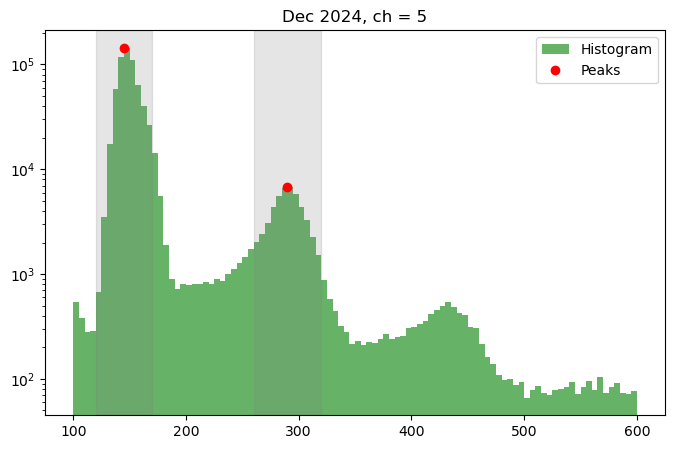

[130. 260.] [199798   8092]


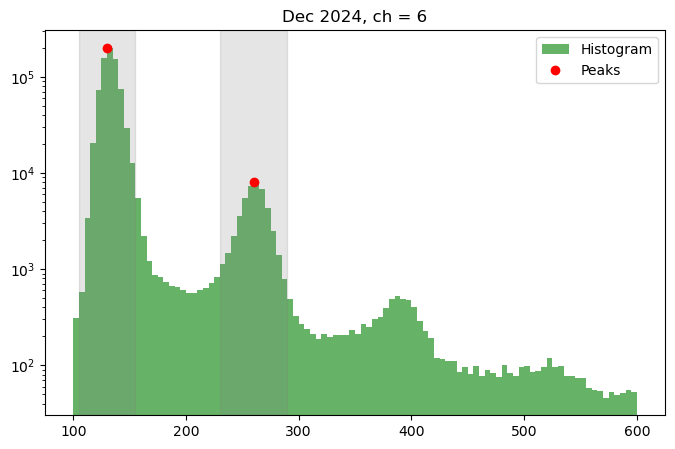

[145. 290.] [146450   7101]


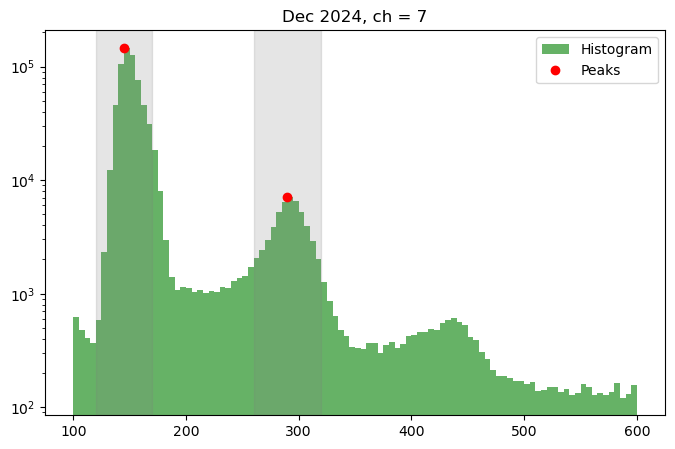

[140. 280.] [151224   6615]


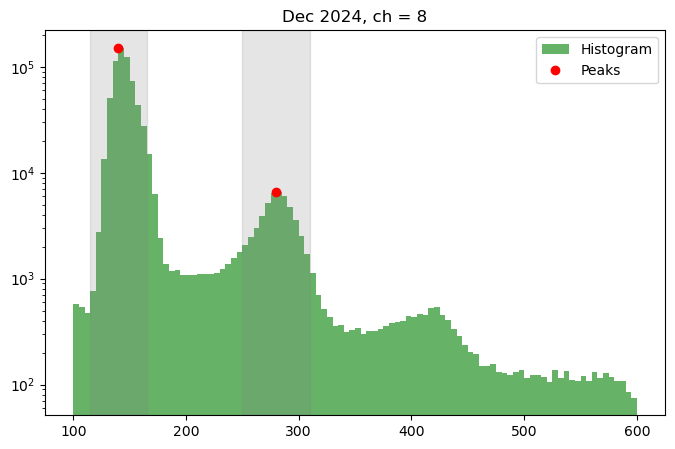

[145. 290.] [53678  2514]


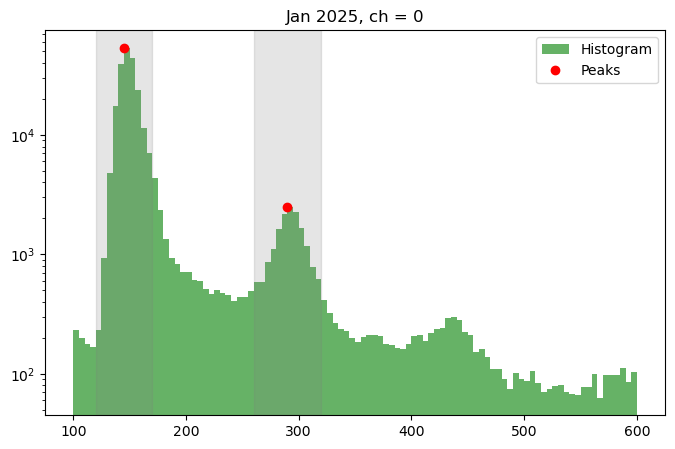

[130. 265.] [49407  2282]


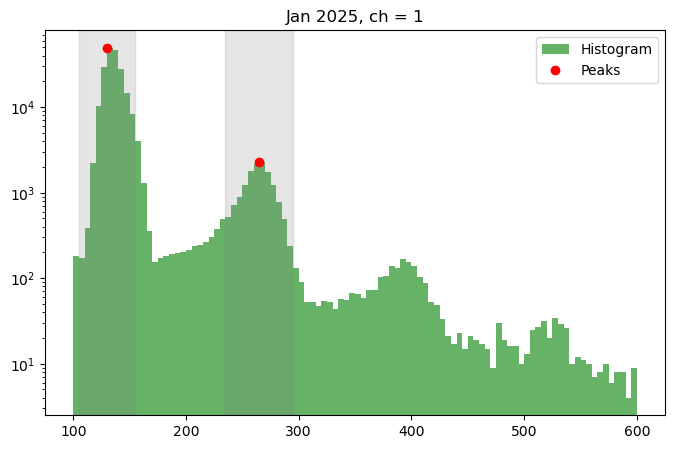

[145. 285.] [75276  4142]


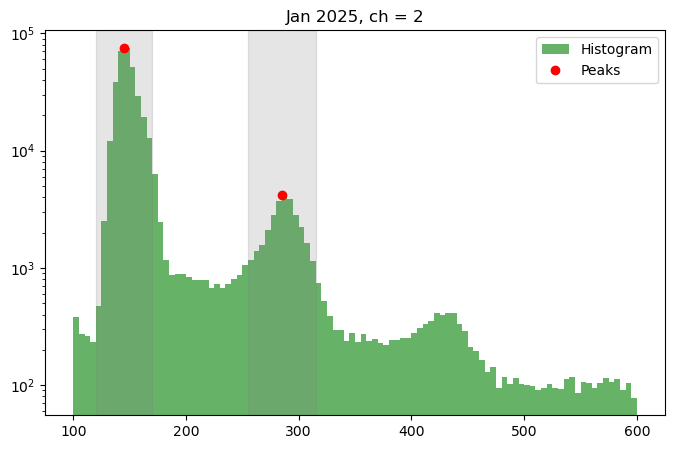

[130. 265.] [95104  4729]


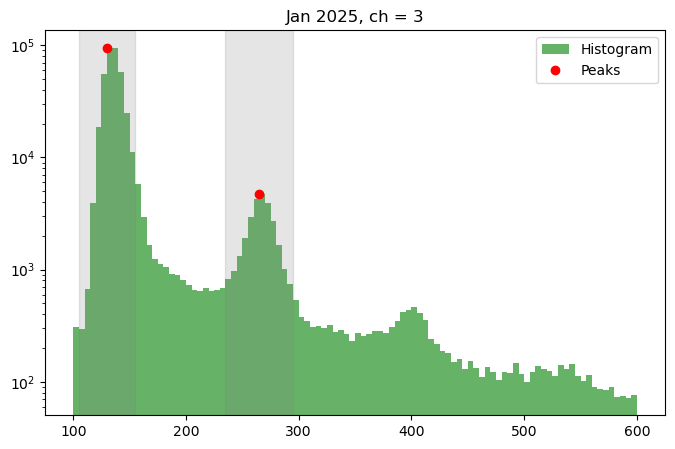

[145. 290.] [90200  4274]


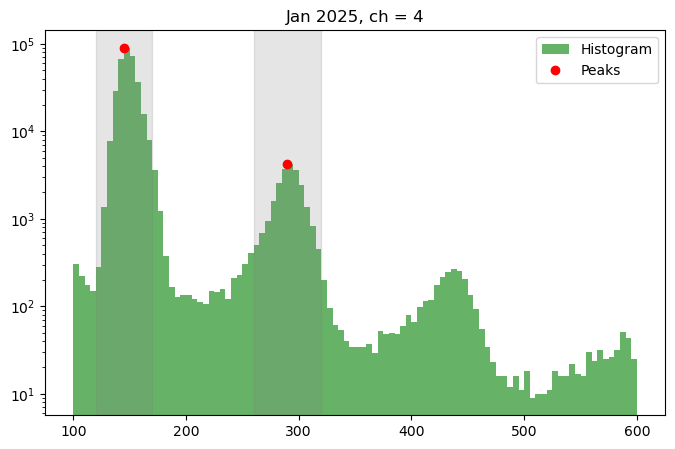

[145. 290.] [90479  4550]


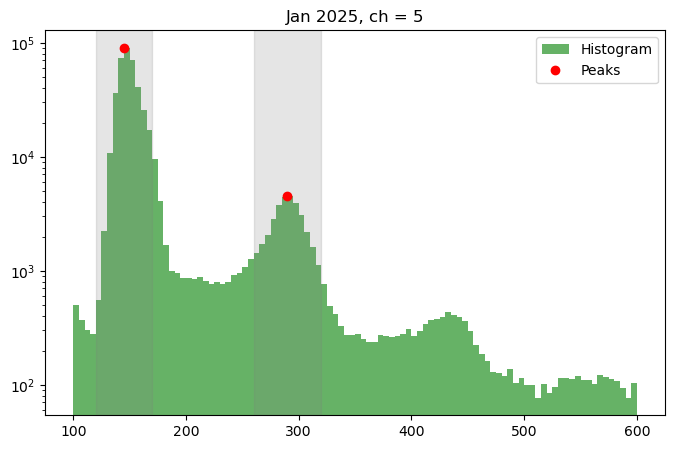

[130. 260.] [116771   5249]


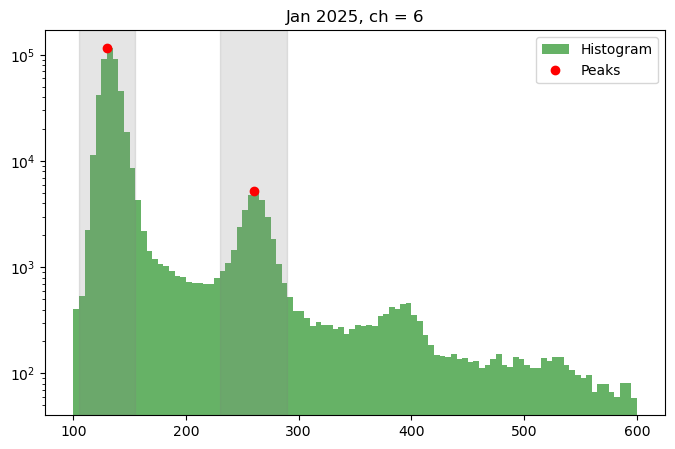

[145. 290.] [93055  4785]


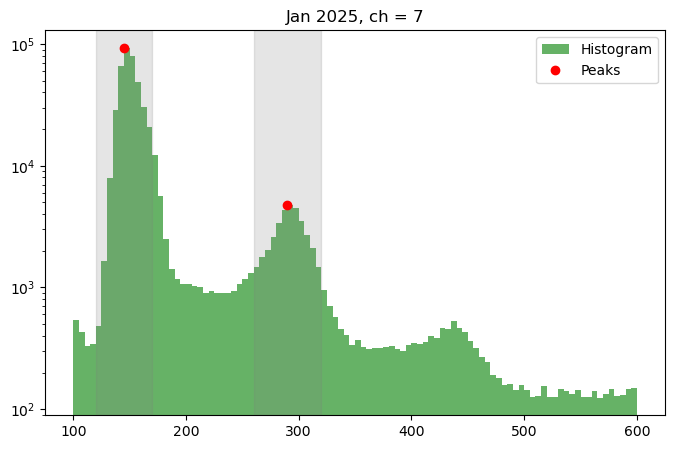

[140. 280.] [95677  4645]


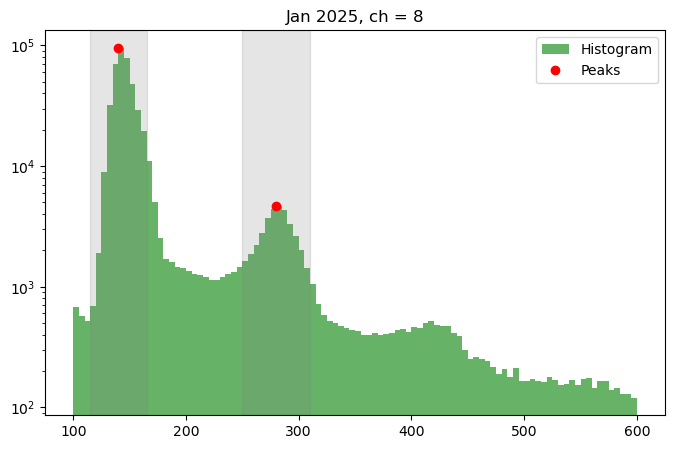

In [40]:
for date_str, month_lab in zip(['09', '10', '11', '12', '01'], ['Sept 2024', 'Oct 2024', 'Nov 2024', 'Dec 2024', 'Jan 2025']):
    sel_dates = [date for date in idx_max.keys() if date.startswith(date_str)]
    for ch in normal_chs:
        ch_vals    = np.concatenate([np.concatenate(height_sg[date][ch]) for date in sel_dates])
        hist, bins = np.histogram(ch_vals, bins=100, range=(100, 600))
        idxs = peakutils.indexes(hist, thres=1000, min_dist=20, thres_abs=True)

        plt.figure(figsize=(8, 5))
        plt.hist(ch_vals, bins=100, range=(100, 600), alpha=0.6, color='g', label="Histogram", log=True)
        plt.plot(bins[idxs], hist[idxs], "ro", label="Peaks")
        print(bins[idxs], hist[idxs])
        plt.axvspan(bins[idxs[0]]-25, bins[idxs[0]]+25, alpha=0.2, color='grey')
        plt.axvspan(bins[idxs[1]]-30, bins[idxs[1]]+30, alpha=0.2, color='grey')
        plt.title(f'{month_lab}, ch = {ch}')
        plt.legend()
        plt.show()

## Try joining all months

In [ ]:
for date_str, month_lab in zip(['09', '10', '11', '12', '01'], ['Sept 2024', 'Oct 2024', 'Nov 2024', 'Dec 2024', 'Jan 2025']):
    sel_dates = [date for date in idx_max.keys() if date.startswith(date_str)]
    for ch in normal_chs:
        ch_vals    = np.concatenate([np.concatenate(height_sg[date][ch]) for date in sel_dates])
        hist, bins = np.histogram(ch_vals, bins=100, range=(100, 600))
        idxs = peakutils.indexes(hist, thres=1000, min_dist=20, thres_abs=True)

        plt.figure(figsize=(8, 5))
        plt.hist(ch_vals, bins=100, range=(100, 600), alpha=0.6, color='g', label="Histogram", log=True)
        plt.plot(bins[idxs], hist[idxs], "ro", label="Peaks")
        print(bins[idxs], hist[idxs])
        plt.axvspan(bins[idxs[0]]-25, bins[idxs[0]]+25, alpha=0.2, color='grey')
        plt.axvspan(bins[idxs[1]]-30, bins[idxs[1]]+30, alpha=0.2, color='grey')
        plt.title(f'{month_lab}, ch = {ch}')
        plt.legend()
        plt.show()

In [42]:
initial_guess = {0: [7000, 145, 25, 3000, 290, 30, 300, 430, 40],
                 1: [],
                 2: [],
                 3: [],
                 4: [],
                 5: [],
                 6: [],
                 7: [],
                 8: []}

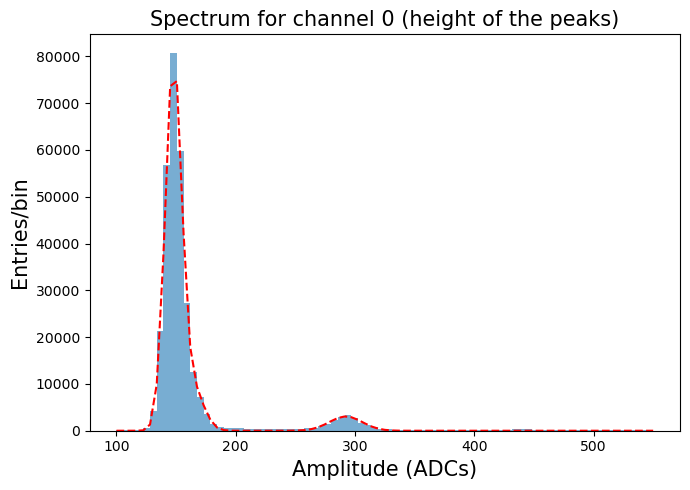

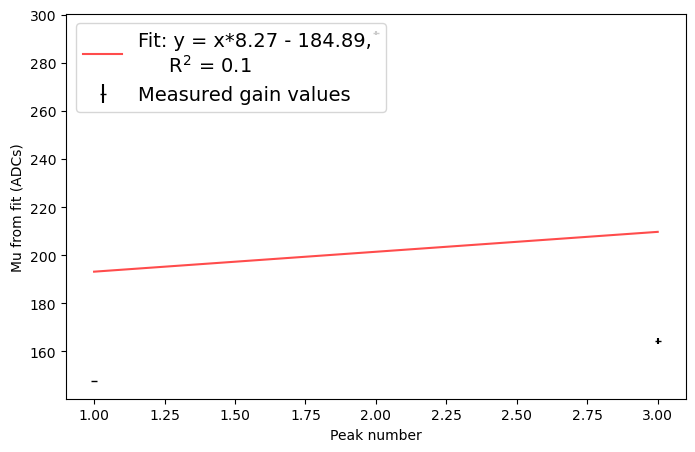

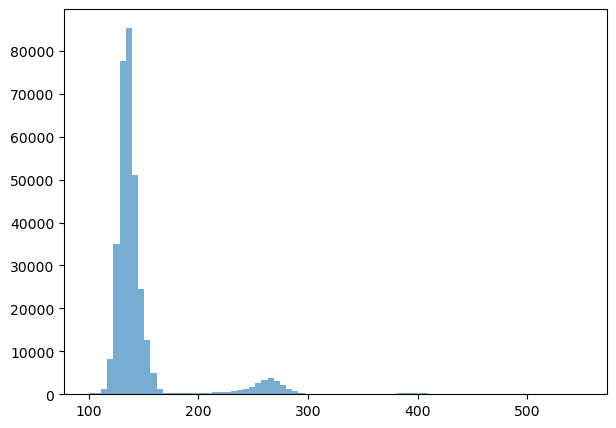

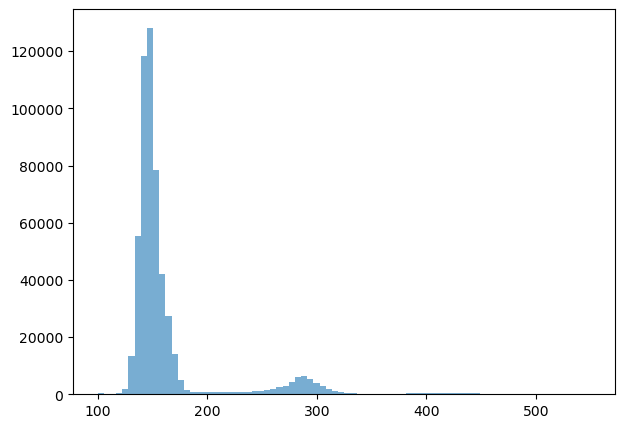

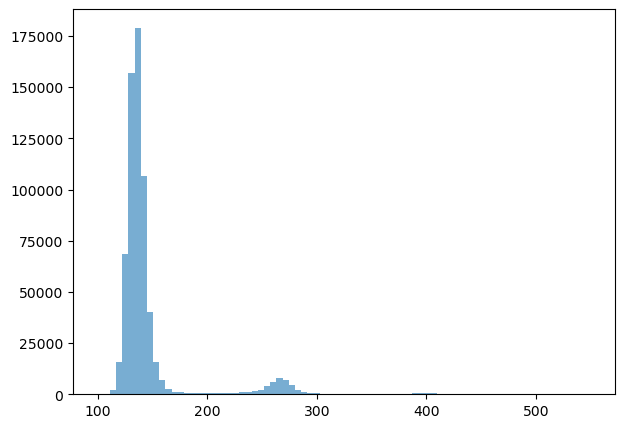

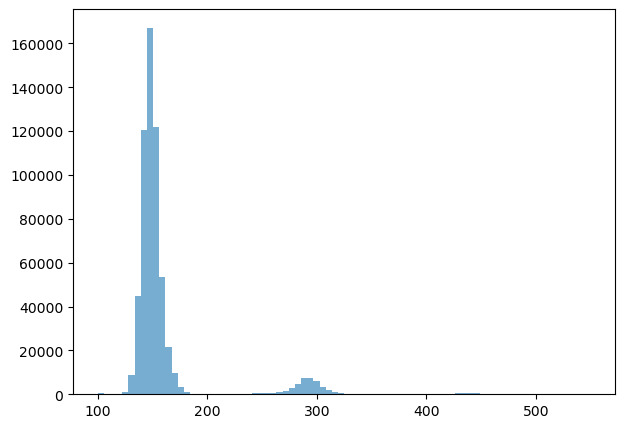

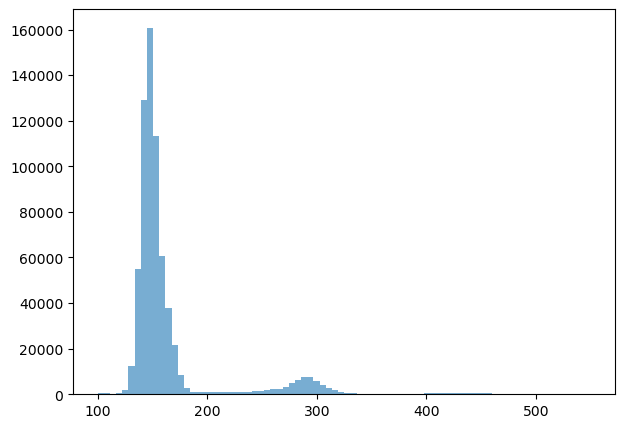

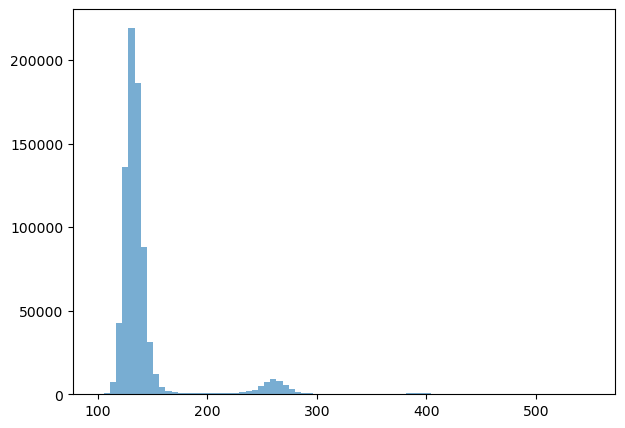

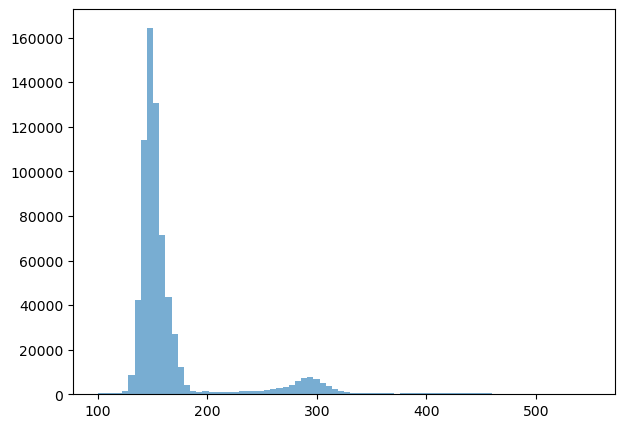

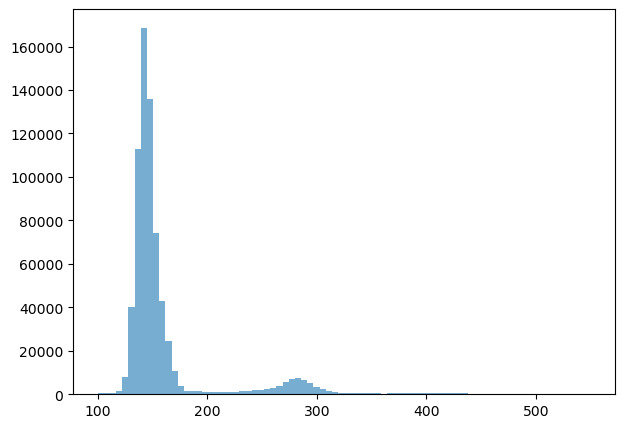

In [58]:
slopes0     = {}
intersects0 = {}
for date_str, month_lab in zip(['09', '10', '11', '12', '01'], ['Sept 2024', 'Oct 2024', 'Nov 2024', 'Dec 2024', 'Jan 2025']):
    if month_lab!='Dec 2024':
        continue
    sel_dates = [date for date in idx_max.keys() if date.startswith(date_str)]
    slope_chs = {}
    inter_chs = {}
    for ch in normal_chs:
        #if ch!=0:
        #    continue
        ch_vals = np.concatenate([np.concatenate(height_sg[date][ch]) for date in sel_dates])

        #hist, bins    = np.histogram(ch_vals, bins=200, range=(100, 600))
        #idxs          = peakutils.indexes(hist, thres=1000, min_dist=20, thres_abs=True)
        #sigma_peaks   = [25, 30, 40]
        #seeds         = np.concatenate([[a, b, c] for a,b,c in zip(hist[idxs], bins[idxs], sigma_peaks)])
        num_peaks_fit = 3
        try:
            slope, inters = fitf.fit_spectrum_and_plot(ch_vals, channel=ch, initial_guess=initial_guess[ch], bins=80, rng=(100, 550), num_peaks_fit=num_peaks_fit)#, title=f'{date}, ch={ch}')
            slope_chs[ch] = slope
            inter_chs[ch] = inters
        except RuntimeError:
            slope_chs[ch] = 0
            inter_chs[ch] = 0
            continue
    if date_str=='01':
        slopes0    [date_str+'_2025'] = slope_chs
        intersects0[date_str+'_2025'] = inter_chs
    else:
        slopes0    [date_str+'_2024'] = slope_chs
        intersects0[date_str+'_2024'] = inter_chs

## Try with pretrigger and high light cuts:

In [64]:
start_time = time.time()

num_evts_pt_hl  = {}
idx_max_pt_hl   = {}
height_sg_pt_hl = {}

print(len(sorted_files))
for ifile,filename in enumerate(sorted_files):
    if ifile%20==0:
        print(ifile)
    d          = np.load(filename, allow_pickle=True)
    date, fnum = extract_date_and_number(filename)
    
    for ch in normal_chs:
        idx_after_cut    = []
        height_after_cut = []
        num_evts         = 0
        idx_peaks_ch     = d['idx_peaks_max']  .item()[ch]
        height_peaks_ch  = d['height_peaks_sg'].item()[ch]
        
        for idxs, vals in zip(idx_peaks_ch, height_peaks_ch):
            if len(idxs)==0:
                continue
            noise_evts = (np.array(idxs)<650)&(np.array(vals)>100)
            if np.any(noise_evts):
                continue
            if np.any(np.array(vals) > 1000):
                continue
            else:
                idx_after_cut   .append(idxs)
                height_after_cut.append(vals)
                num_evts += 1
                
        if date not in idx_max_pt_hl:
            print(date)
            num_evts_pt_hl [date] = {}
            idx_max_pt_hl  [date] = {}
            height_sg_pt_hl[date] = {}


        if ch not in idx_max_pt_hl[date]:
            try:
                num_evts_pt_hl [date][ch] = np.array([num_evts])
                idx_max_pt_hl  [date][ch] = np.concatenate(idx_after_cut)
                height_sg_pt_hl[date][ch] = np.concatenate(height_after_cut)
            except Exception as e:
                print(e)
                continue
        else:
            try:
                idx_max_pt_hl  [date][ch] = np.concatenate((idx_max_pt_hl  [date][ch], np.concatenate(idx_after_cut)))
                height_sg_pt_hl[date][ch] = np.concatenate((height_sg_pt_hl[date][ch], np.concatenate(height_after_cut)))
                num_evts_pt_hl [date][ch] = np.concatenate((num_evts_pt_hl [date][ch], np.array([num_evts])))
            except Exception as e:
                print(e)
                continue

end_time     = time.time()
elapsed_time = end_time - start_time
print(f"Elapsed time: {elapsed_time} s, {elapsed_time/60} min")

1379
0
09_10_2024
09_11_2024
20
40
09_12_2024
60
09_20_2024
80
100
120
140
160
09_25_2024
180
200
220
09_28_2024
240
260
280
10_04_2024
300
320
340
360
need at least one array to concatenate
10_11_2024
380
400
420
440
460
10_17_2024
480
500
520
540
560
10_25_2024
580
600
620
640
11_01_2024
660
680
700
720
11_11_2024
740
760
780
800
820
11_25_2024
840
860
880
900
920
12_13_2024
940
960
980
1000
1020
12_21_2024
1040
1060
1080
1100
01_02_2025
1120
1140
1160
1180
1200
01_10_2025
1220
1240
1260
1280
01_19_2025
1300
1320
1340
1360
Elapsed time: 346.7853910923004 s, 5.779756518205007 min


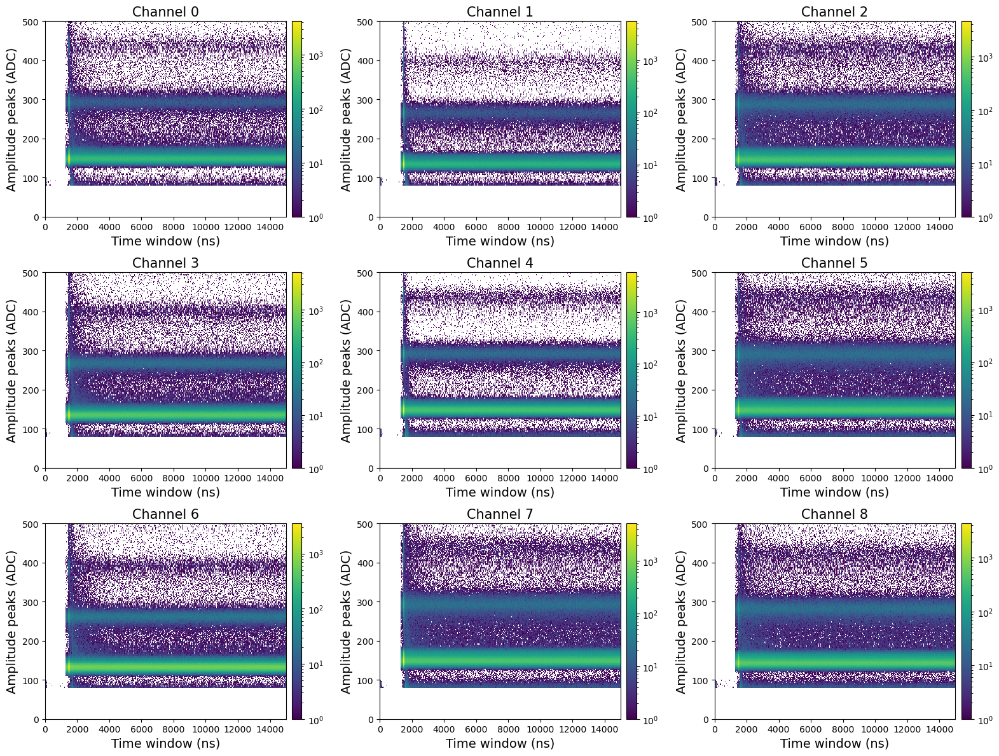

In [69]:
sel_dates = idx_max_pt_hl.keys()
fig, axs  = plt.subplots(3, 3, figsize=(16, 12))
for ch in normal_chs:
    i = int(ch/3)
    j = ch%3
    
    try:
        ch_idxs = np.concatenate([idx_max_pt_hl  [date][ch] for date in sel_dates])
        ch_vals = np.concatenate([height_sg_pt_hl[date][ch] for date in sel_dates])
    
        fig0 = axs[i][j].hist2d(ch_idxs*2, ch_vals, bins=(500, 200), range=((0, 15000), (0, 500)), cmin=1, norm=LogNorm())
        axs[i][j].set_xlabel('Time window (ns)',      fontsize=14)
        axs[i][j].set_ylabel('Amplitude peaks (ADC)', fontsize=14)
        axs[i][j].set_title(f"Channel {ch}",          fontsize=15)
        fig.colorbar(fig0[3], ax=axs[i][j], pad=0.02)
    except Exception as e:
        print(e)
        continue
plt.tight_layout()
#plt.savefig(f'/Users/romoluque_c/Repositories/BACON_romo/analysis_documentation_run3/images/hit_maps_pretrigg_and_high_light.pdf', dpi=300, bbox_inches='tight')
plt.show()

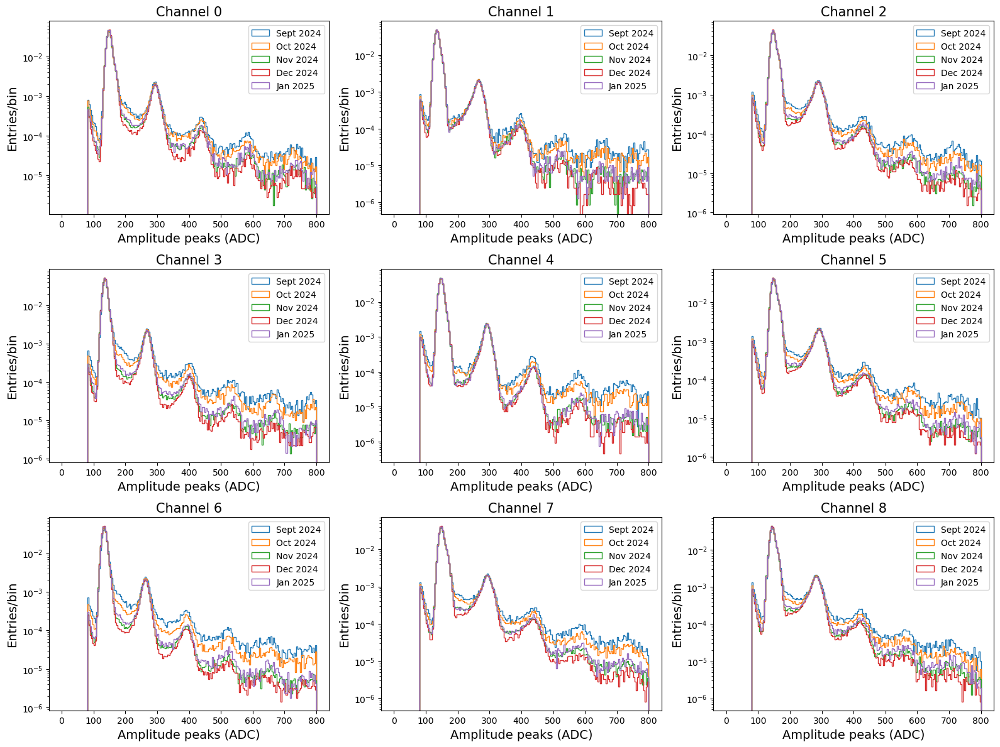

In [75]:
fig, axs = plt.subplots(3, 3, figsize=(16, 12))
for date_str, month_lab in zip(['09', '10', '11', '12', '01'], ['Sept 2024', 'Oct 2024', 'Nov 2024', 'Dec 2024', 'Jan 2025']):

    sel_dates = [date for date in idx_max_pt_hl.keys() if date.startswith(date_str)]
    for ch in normal_chs:
        i = int(ch/3)
        j = ch%3
        try:
            ch_vals = np.concatenate([height_sg_pt_hl[date][ch] for date in sel_dates])
        
            fig0 = axs[i][j].hist(ch_vals, bins=200, range=(0, 800), log=True, histtype='step', label=month_lab, density=True)
            axs[i][j].set_xlabel('Amplitude peaks (ADC)', fontsize=14)
            axs[i][j].set_ylabel('Entries/bin',           fontsize=14)
            axs[i][j].set_title(f"Channel {ch}",           fontsize=15)
            axs[i][j].legend()
        except Exception as e:
            print(e)
            continue
plt.tight_layout()
plt.show()

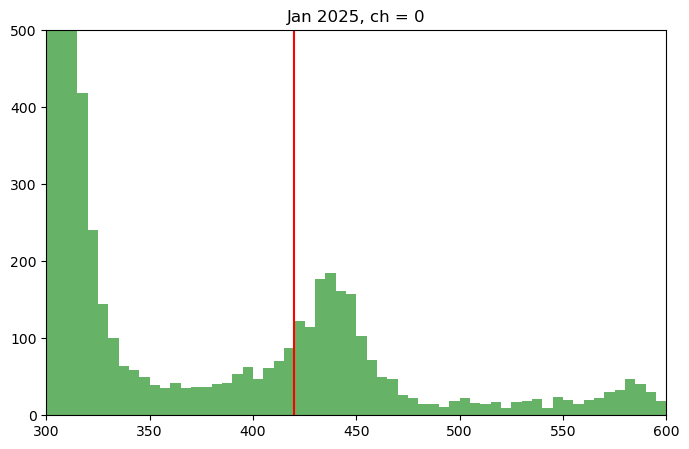

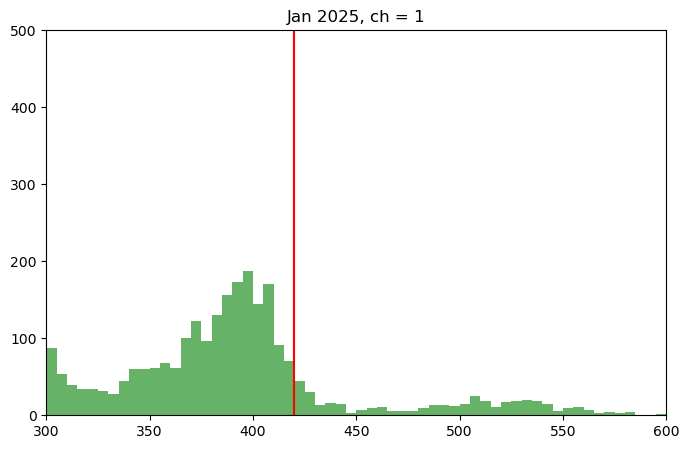

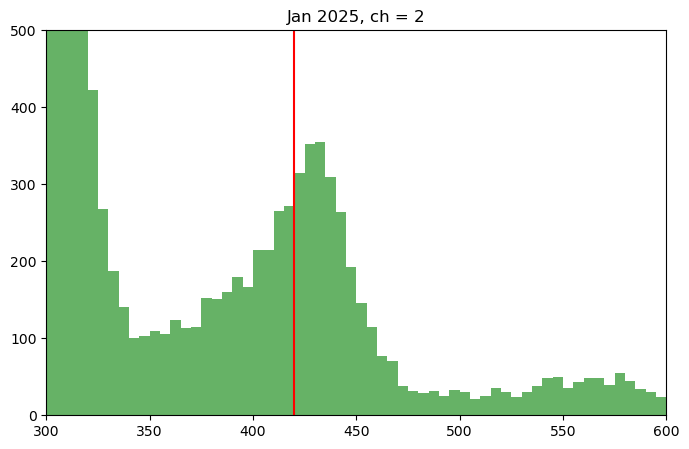

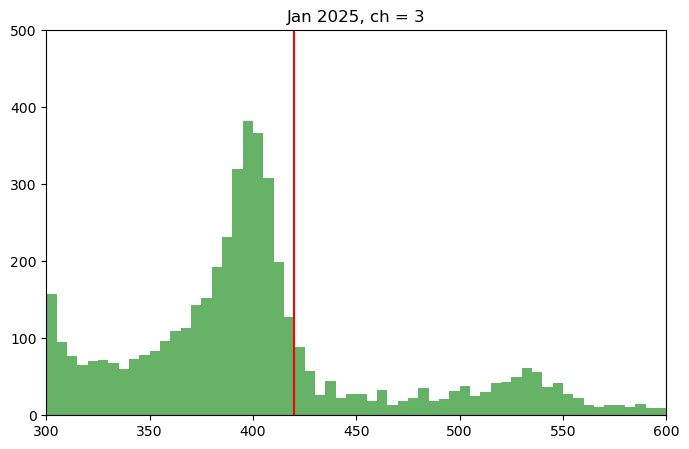

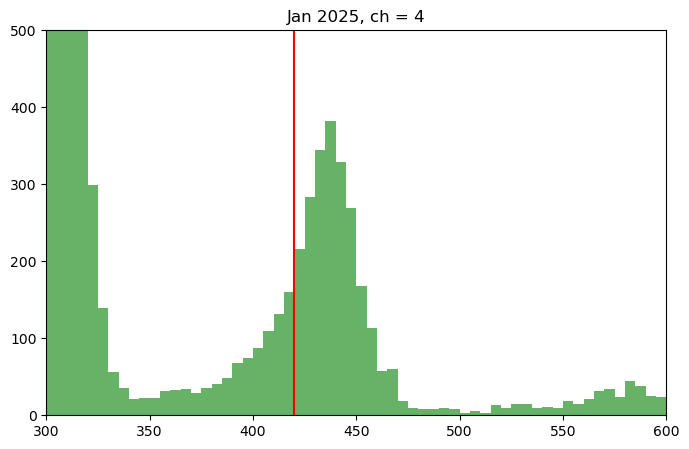

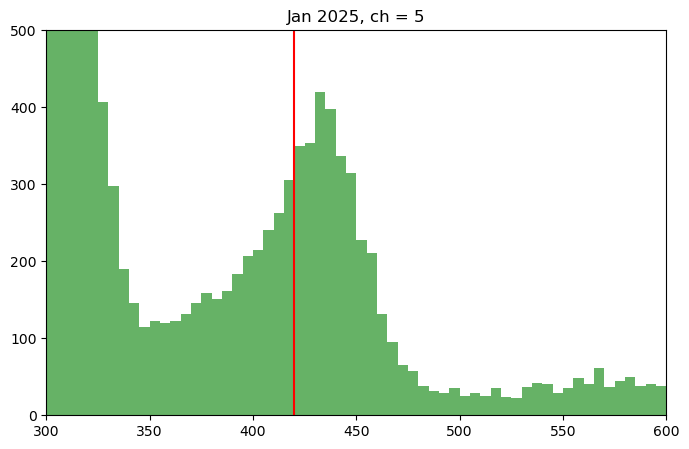

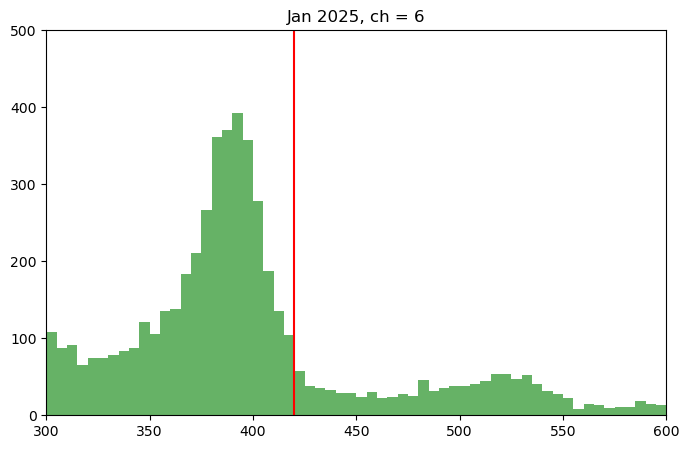

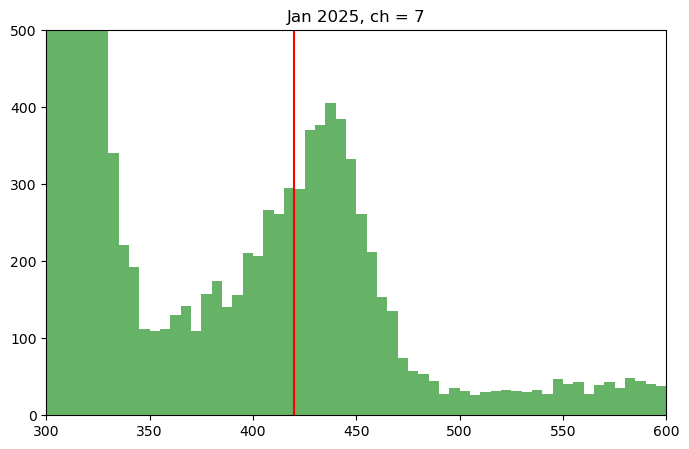

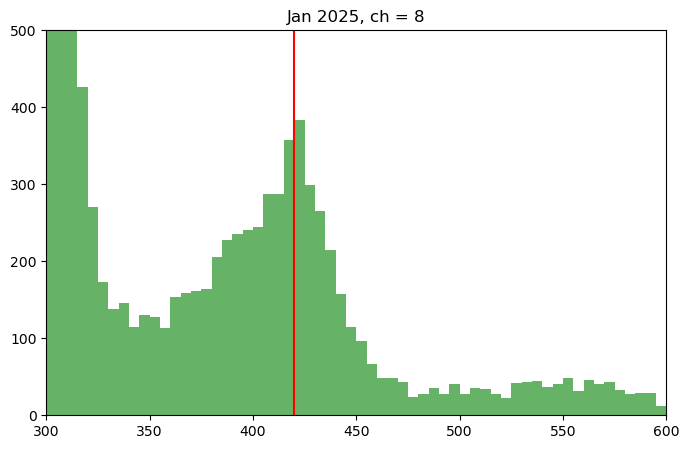

In [100]:
sel_dates = [date for date in height_sg_pt_hl.keys() if date.startswith('12')]
for ch in normal_chs:
    ch_vals    = np.concatenate([height_sg_pt_hl[date][ch] for date in sel_dates])

    plt.figure(figsize=(8, 5))
    plt.hist(ch_vals, bins=100, range=(100, 600), alpha=0.6, color='g')
    plt.axvline(420, color='r')
    plt.title(f'{month_lab}, ch = {ch}')
    plt.xlim(300, 600)
    plt.ylim(0, 500)
    plt.show()

In [101]:
initial_guess = {0: [ 70000, 145, 25, 3000, 290, 30, 200, 430, 40],
                 1: [ 70000, 130, 25, 3000, 260, 30, 200, 395, 40],
                 2: [110000, 145, 25, 5000, 285, 30, 300, 430, 40],
                 3: [150000, 130, 25, 7000, 265, 30, 400, 400, 40],
                 4: [150000, 145, 25, 7000, 290, 30, 400, 438, 40],
                 5: [140000, 145, 25, 7000, 290, 30, 400, 435, 40],
                 6: [200000, 130, 25, 8000, 260, 30, 400, 390, 40],
                 7: [140000, 145, 25, 7000, 290, 30, 400, 435, 40],
                 8: [150000, 140, 25, 6000, 280, 30, 400, 420, 40]}

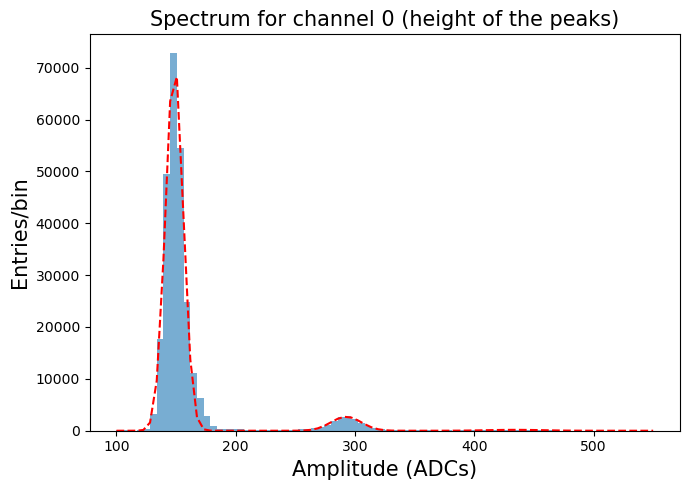

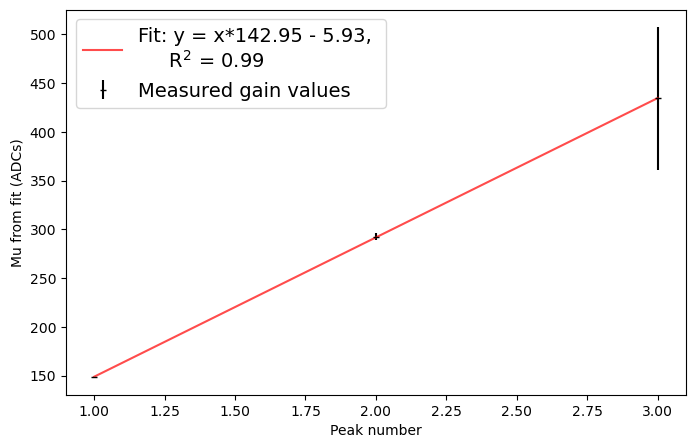

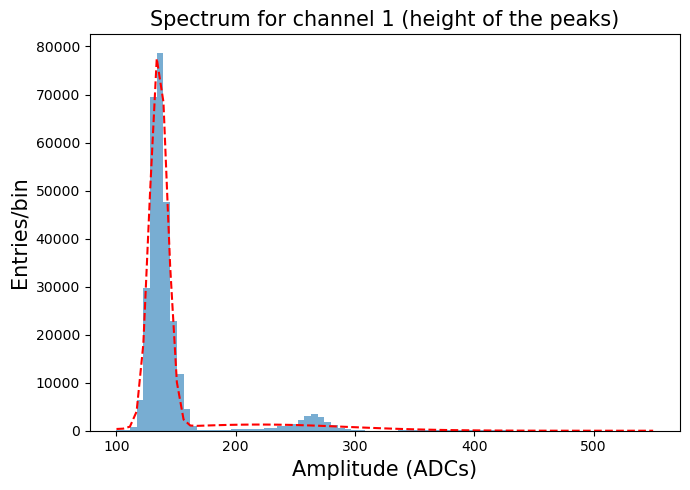

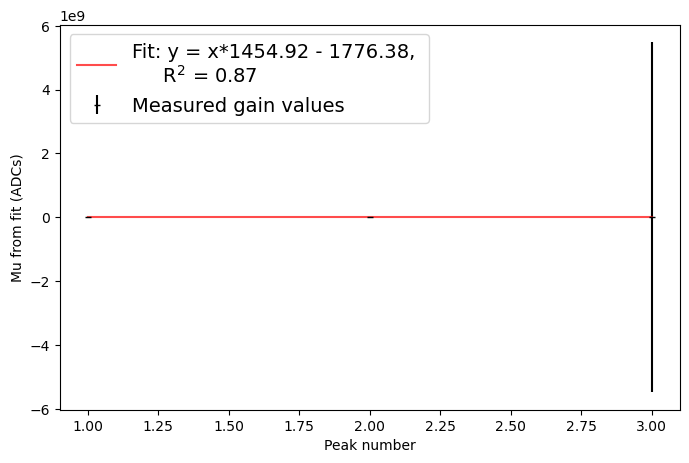

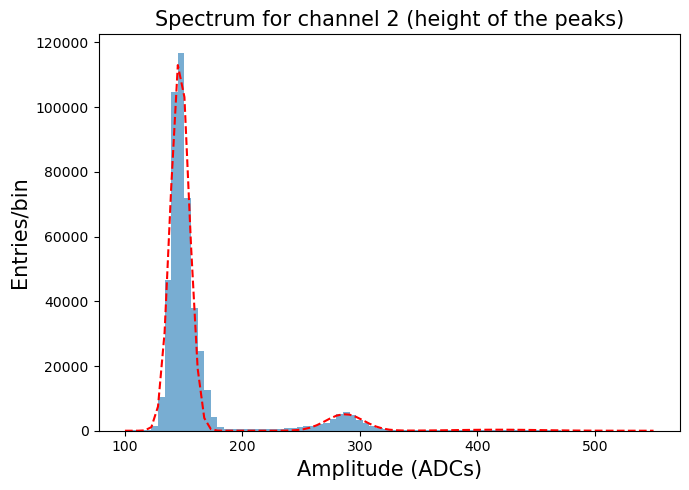

...

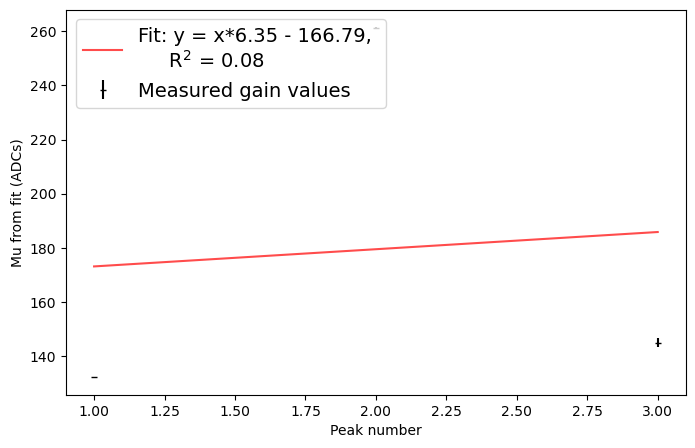

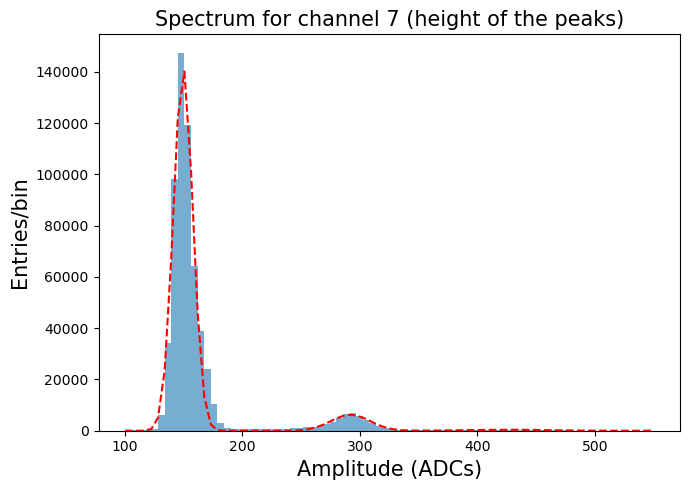

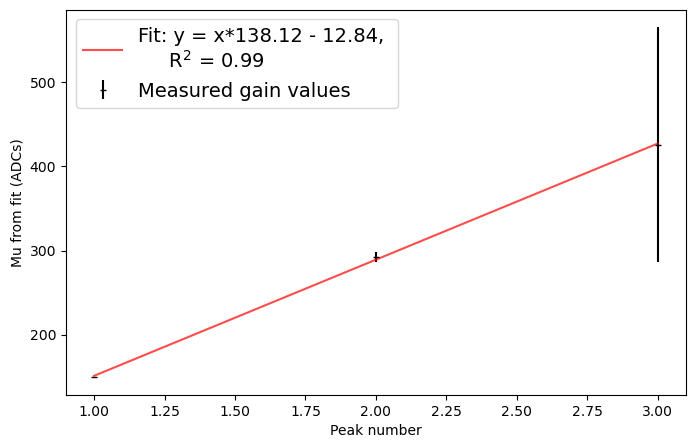

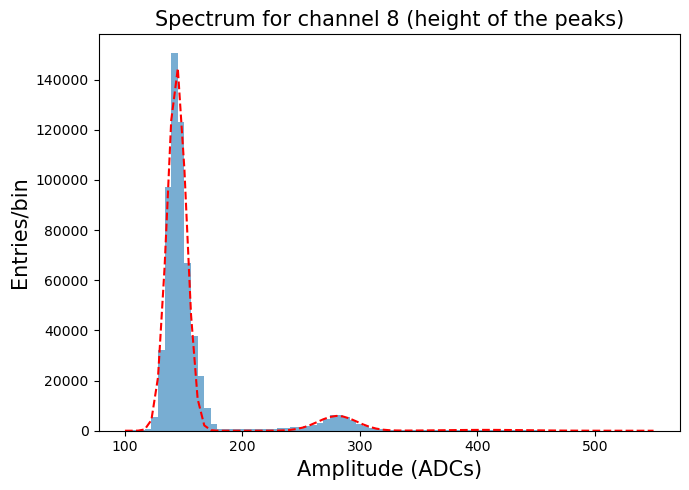

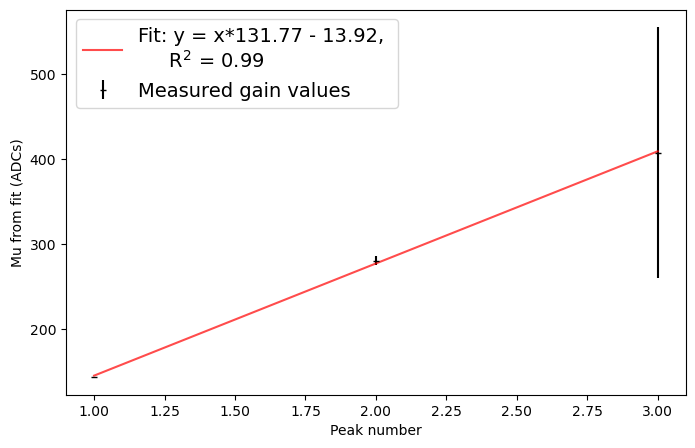

In [102]:
slopes0     = {}
intersects0 = {}
for date_str, month_lab in zip(['09', '10', '11', '12', '01'], ['Sept 2024', 'Oct 2024', 'Nov 2024', 'Dec 2024', 'Jan 2025']):
    if month_lab!='Dec 2024':
        continue
    sel_dates = [date for date in height_sg_pt_hl.keys() if date.startswith(date_str)]
    slope_chs = {}
    inter_chs = {}
    for ch in normal_chs:
        ch_vals = np.concatenate([height_sg_pt_hl[date][ch] for date in sel_dates])
        num_peaks_fit = 3
        try:
            slope, inters = fitf.fit_spectrum_and_plot(ch_vals, channel=ch, initial_guess=initial_guess[ch], bins=80, rng=(100, 550), num_peaks_fit=num_peaks_fit)#, title=f'{date}, ch={ch}')
            slope_chs[ch] = slope
            inter_chs[ch] = inters
        except RuntimeError:
            slope_chs[ch] = 0
            inter_chs[ch] = 0
            continue
    if date_str=='01':
        slopes0    [date_str+'_2025'] = slope_chs
        intersects0[date_str+'_2025'] = inter_chs
    else:
        slopes0    [date_str+'_2024'] = slope_chs
        intersects0[date_str+'_2024'] = inter_chs

In [104]:
intersects0

{'12_2024': {0: 5.925516504672885,
  1: -1776.3815504099985,
  2: 12.886940128979688,
  3: 169.63306777670826,
  4: 5.262249067076141,
  5: 11.814608585414646,
  6: 166.79234597605122,
  7: 12.840035406465972,
  8: 13.920194919770552}}

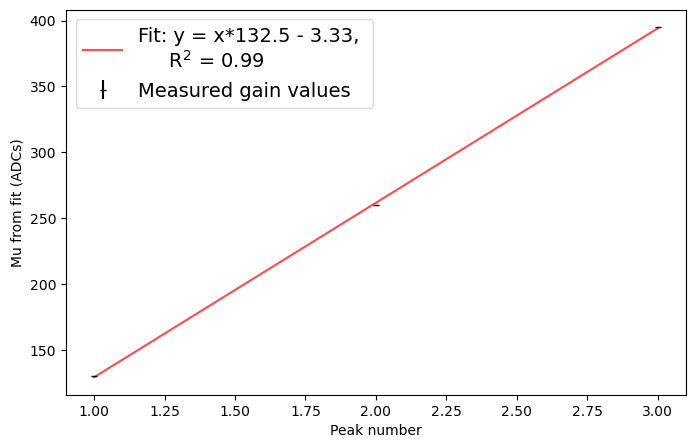

1 132.5 -3.3333333333333144


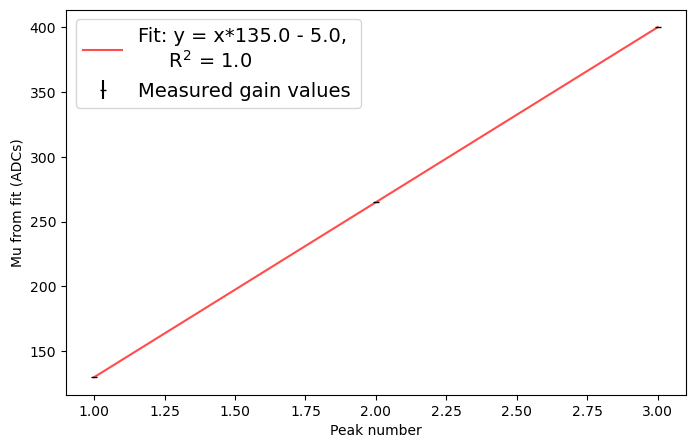

3 135.0 -5.0


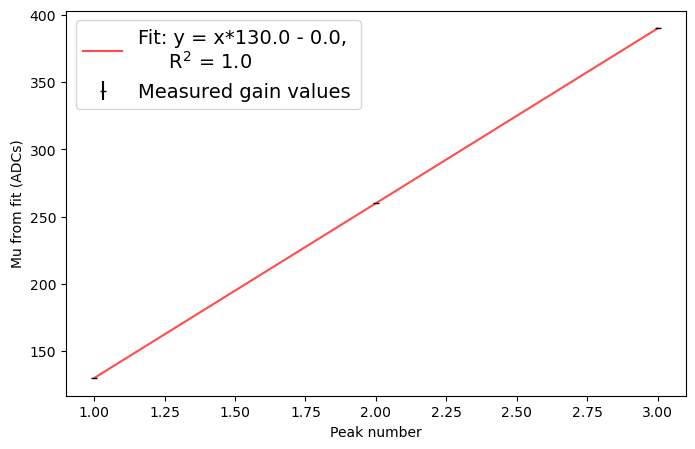

6 130.0 0.0


In [106]:
#1: [ 70000, 130, 25, 3000, 260, 30, 200, 395, 40],
#3: [150000, 130, 25, 7000, 265, 30, 400, 400, 40],
#6: [200000, 130, 25, 8000, 260, 30, 400, 390, 40],
    
for ch, yvals, yerr in zip([1, 3, 6], [[130, 260, 395], [130, 265, 400], [130, 260, 390]], 3*[0.001, 0.01, 0.1]):
    sel_dates = [date for date in height_sg_pt_hl.keys() if date.startswith('12')]
    ch_vals   = np.concatenate([height_sg_pt_hl[date][ch] for date in sel_dates])
    slope, inters = fitf.plot_linear_fit(yvals, yerr)
    print(ch, slope, inters)

In [ ]:
gains_all_chs = {0: (142.951, 5.925),
                 1: (132.500, -3.333),
                 2: (135.502, 12.886),
                 3: (135.000  -5.000),
                 4: (143.315,  5.262),
                 5: (137.660, 11.814),
                 6: (130.000, 0.),
                 7: (138.123, 12.840),
                 8: (131.772, 13.920),
                 9: {'09_10_2024': (713.445, -20.038), 
                     '09_11_2024': (716.176, -19.673), 
                     '09_12_2024': (719.783, -10.151), 
                     '09_20_2024': (722.221, -11.124), 
                     '09_25_2024': (723.042, -11.830), 
                     '09_28_2024': (721.611, -12.276), 
                     '10_04_2024': (720.181, -12.722), 
                     '10_11_2024': (725.152, -12.032), 
                     '10_17_2024': (728.640, -11.851), 
                     '10_25_2024': (722.907, -12.550), 
                     '11_01_2024': (724.566, -11.215), 
                     '11_11_2024': (714.408, -12.857), 
                     '11_25_2024': (704.251, -14.499), 
                     '12_13_2024': (691.857,   2.794), 
                     '12_21_2024': (680.420,  -3.534), 
                     '01_02_2025': (671.088,   4.511), 
                     '01_10_2025': (703.052,   0.083), 
                     '01_19_2025': (707.833,  -5.059)},
                 
                 10: {'09_10_2024': (707.800, 43.580), 
                      '09_11_2024': (707.968, 44.407), 
                      '09_12_2024': (706.610, 45.092), 
                      '09_20_2024': (703.655, 53.165), 
                      '09_25_2024': (703.754, 53.722), 
                      '09_28_2024': (704.139, 52.949), 
                      '10_04_2024': (705.643, 52.823), 
                      '10_11_2024': (706.706, 53.208), 
                      '10_17_2024': (707.740, 53.039), 
                      '10_25_2024': (707.276, 53.987), 
                      '11_01_2024': (705.825, 54.078), 
                      '11_11_2024': (705.377, 53.354), 
                      '11_25_2024': (705.761, 52.763), 
                      '12_13_2024': (709.026, 53.851), 
                      '12_21_2024': (709.094, 55.053), 
                      '01_02_2025': (709.721, 55.118), 
                      '01_10_2025': (710.348, 55.183), 
                      '01_19_2025': (711.481, 54.422)},
                 
                 11: {'09_10_2024': (641.030, 48.974), 
                      '09_11_2024': (642.714, 47.617), 
                      '09_12_2024': (645.527, 48.325), 
                      '09_20_2024': (648.580, 45.411), 
                      '09_25_2024': (651.633, 42.497), 
                      '09_28_2024': (651.651, 42.437), 
                      '10_04_2024': (652.104, 42.815), 
                      '10_11_2024': (652.307, 42.757), 
                      '10_17_2024': (652.510, 42.698), 
                      '10_25_2024': (641.258, 60.174), 
                      '11_01_2024': (647.961, 51.403), 
                      '11_11_2024': (654.665, 42.632), 
                      '11_25_2024': (656.109, 43.477), 
                      '12_13_2024': (656.052, 44.115), 
                      '12_21_2024': (655.995, 44.754), 
                      '01_02_2025': (655.938, 45.393), 
                      '01_10_2025': (655.881, 46.032), 
                      '01_19_2025': (656.365, 44.774)}}